In [5]:
!pip install torchmetrics
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.5/963.5 kB 54.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 91.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 93.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [6]:
!pip install -U albumentations

In [7]:
import numpy as np
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from torchvision.transforms import CenterCrop
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn.functional as F
import torch.nn as nn
from tqdm.notebook import tqdm
from torchmetrics import JaccardIndex
from segmentation_models_pytorch.losses import DiceLoss, FocalLoss
from time import time
import gc
import pandas as pd

In [ ]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(DEVICE)

cuda


Подгрузка и разархивирование необходимых директорий с гугл диска.

In [1]:
import gdown

In [2]:
!gdown --id 1oxlMgr6C3jkb827iYrL2B6EPwa_ONoRu
!unzip train.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: train/gt/chicago15_70.png  
  inflating: train/gt/chicago15_73.png  
  inflating: train/gt/chicago15_68.png  
  inflating: train/gt/chicago15_76.png  
  inflating: train/gt/chicago15_77.png  
  inflating: train/gt/chicago15_71.png  
  inflating: train/gt/chicago15_84.png  
  inflating: train/gt/chicago15_86.png  
  inflating: train/gt/chicago15_87.png  
  inflating: train/gt/chicago15_89.png  
  inflating: train/gt/chicago15_88.png  
  inflating: train/gt/chicago15_96.png  
  inflating: train/gt/chicago15_95.png  
  inflating: train/gt/chicago15_98.png  
  inflating: train/gt/chicago15_97.png  
  inflating: train/gt/chicago15_99.png  
  inflating: train/gt/chicago15_100.png  
  inflating: train/gt/chicago15_103.png  
  inflating: train/gt/chicago15_106.png  
  inflating: train/gt/chicago15_107.png  
  inflating: train/gt/chicago15_108.png  
  inflating: train/gt/chicago15_111.png  
  inflating: train/gt/ch

In [3]:
!gdown --id 1aswekfugAaXXUEA5jPZoSqvyFPv_PLzF
!unzip test.zip

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1aswekfugAaXXUEA5jPZoSqvyFPv_PLzF
To: /content/test.zip
100% 6.20M/6.20M [00:00<00:00, 15.6MB/s]
Archive:  test.zip
   creating: test/
  inflating: test/desktop.ini        
   creating: test/gt/
  inflating: test/gt/Brandenburg_0.png  
  inflating: test/gt/Brandenburg_10.png  
  inflating: test/gt/Brandenburg_100.png  
  inflating: test/gt/Brandenburg_101.png  
  inflating: test/gt/Brandenburg_102.png  
  inflating: test/gt/Brandenburg_104.png  
  inflating: test/gt/Brandenburg_105.png  
  inflating: test/gt/Brandenburg_109.png  
  inflating: test/gt/Brandenburg_11.png  
  inflating: test/gt/Brandenburg_110.png  
  inflating: test/gt/Brandenburg_111.png  
  inflating: test/gt/Brandenburg_113.png  
  inflating: test/gt

In [8]:
BASE_DIR = Path('/content/') #/kaggle/working/
TRAIN_DIR = BASE_DIR.joinpath("train/")
TEST_DIR = BASE_DIR.joinpath("test/")
TRAIN_IMG_DIR = TRAIN_DIR.joinpath("images/")
TRAIN_GT_DIR = TRAIN_DIR.joinpath("gt/")
TEST_IMG_DIR = TEST_DIR.joinpath("images/")

# Загрузка датасета

Получим имена изображений для тренировочной выборки.

In [9]:
train_val_subimg_files = sorted(list(TRAIN_IMG_DIR.rglob('*.png')))
train_val_subimg_labels = [path.name for path in train_val_subimg_files]

Поделим на тренировочную и валидационную части.

In [10]:
from sklearn.model_selection import train_test_split

train_files, val_files = train_test_split(train_val_subimg_labels, test_size=0.20)

In [11]:
DATA_MODES = ['train', 'val', 'test']
class GeodataDataset(Dataset):
    """
    Датасет для загрузки изображений и масок. Может загружать данные в трех
    режимах: 'train', 'val', 'test'. В режиме 'test' загружает только изображения
    без масок.
    """
    def __init__(self, files, img_path, mode, transforms, gt_path=None):
        super().__init__()

        self.files = sorted(files)
        self.mode = mode
        self.transforms = transforms

        if self.mode not in DATA_MODES:
            print(f"{self.mode} is not correct; correct modes: {DATA_MODES}")
            raise NameError

        self.len_ = len(self.files)
        print(f'Found {self.len_} images for {self.mode} part')

        self.img_path = img_path
        if self.mode != 'test':
            self.gt_path = gt_path

    def __len__(self):
        return self.len_

    def load_sample(self, file, mode_gt=False):
        if mode_gt:
            image = Image.open(file).convert('L') # на случай, если маска трехканальная
        else:
            image = Image.open(file)
        return np.array(image)/255  #для использования albumentations


    def padded_image(self, image):
        """
        Добавляет зеркальные границы к изображению для получения размера 326x326.
        Это позволит лучше сегментировать пиксели на краях изображения.
        """
        (_, H, W) = image.shape
        pad_h = (326 - H) // 2
        pad_w = (326 - W) // 2
        image = F.pad(
            image,
            pad=(pad_w, pad_w, pad_h, pad_h),  # (left, right, top, bottom)
            mode='reflect'
        )
        return image

    def __getitem__(self, index):
        x = self.load_sample(self.img_path.joinpath(self.files[index]))
        if self.mode == 'test':
            transformed = self.transforms(image=x)
            x = transformed["image"]
            x = self.padded_image(x)
            return x
        y = self.load_sample(self.gt_path.joinpath(self.files[index]), mode_gt=True)
        transformed = self.transforms(image=x, mask=y)
        x = transformed["image"]
        x = self.padded_image(x)
        y = transformed["mask"].unsqueeze(0)
        return x, y


In [12]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

train_transform = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.1),
        A.Rotate(limit=(40,60),p=0.5),
        A.Normalize(mean=mean, std=std, max_pixel_value=1.0),
        ToTensorV2(),
    ]
)

test_transform = A.Compose(
    [
        A.Normalize(mean=mean, std=std, max_pixel_value=1.0),
        ToTensorV2(),
    ]
)

In [13]:
train_dataset = GeodataDataset(train_files, img_path=TRAIN_IMG_DIR, mode='train', transforms=train_transform, gt_path=TRAIN_GT_DIR)
val_dataset = GeodataDataset(val_files, img_path=TRAIN_IMG_DIR, mode='val', transforms=test_transform, gt_path=TRAIN_GT_DIR)

Found 10199 images for train part
Found 2550 images for val part


Всего получаем 10199 изображений в тренировочной выборке и 2550 в валидационной.

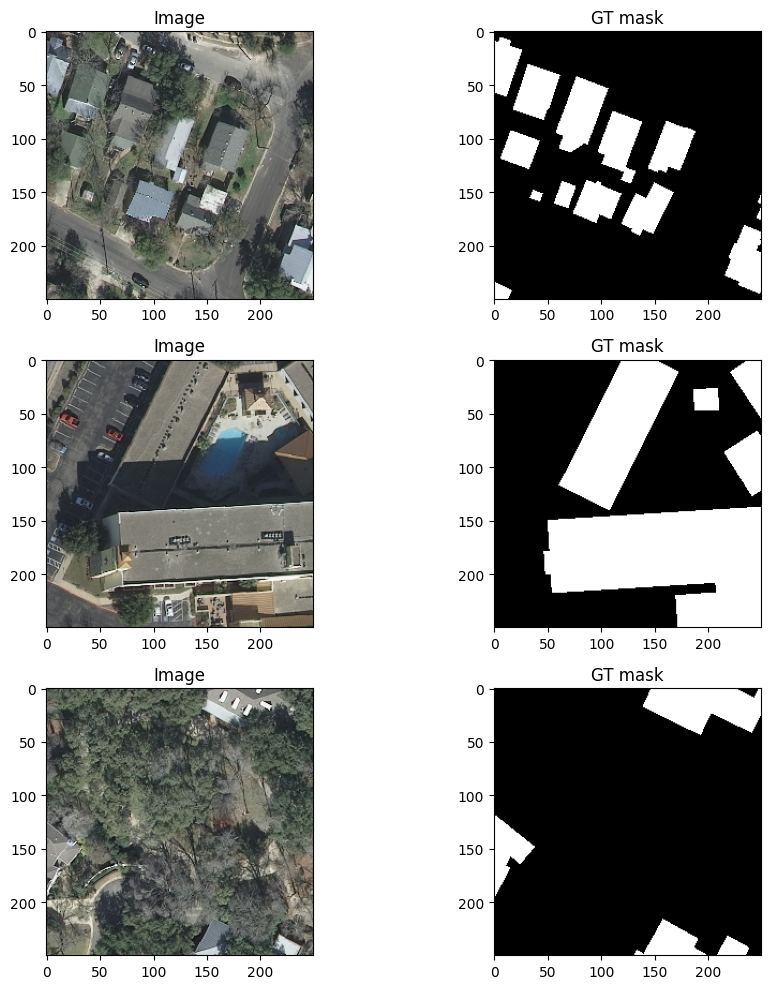

In [14]:
fig, ax = plt.subplots(nrows=3, ncols=2,figsize=(10, 10))
for fig_x in ax:
    random_img = int(np.random.uniform(0,2550))
    img, gt = val_dataset[random_img]
    img = CenterCrop(size=[250, 250])(img)
    img = img.data.cpu().numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    gt = gt.data.cpu().numpy().transpose((1, 2, 0))
    fig_x[0].set_title("Image")
    fig_x[0].imshow(img)
    fig_x[1].set_title("GT mask")
    fig_x[1].imshow(gt, cmap='gray')

plt.tight_layout()
plt.show()

# Архитектура сети

In [ ]:
class ConvReLU(nn.Module):
    def __init__(self, in_c, out_c, kernel_size=3, padding=1) -> None:
        super(ConvReLU, self).__init__()
        self.conv = nn.Conv2d(in_c, out_c, kernel_size=kernel_size, padding=padding)
        self.bn = nn.BatchNorm2d(out_c)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

class EncoderBlockUnet(nn.Module):
    def __init__(self, in_c, out_c, depth=2, kernel_size=3, padding=[1,1,]) -> None:
        super(EncoderBlockUnet, self).__init__()
        self.layers = nn.ModuleList()
        for i in range(depth):
            self.layers.append(ConvReLU(in_c if i == 0 else out_c, out_c, kernel_size, padding[i]))
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        x_copy = x
        x = self.pool(x)
        return x, x_copy

class DecoderBlockUnet(nn.Module):
    def __init__(self, in_c, out_c, depth=2, kernel_size=3, padding=[1,1,]) -> None:
        super(DecoderBlockUnet, self).__init__()
        self.unconv = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2)
        self.layers = nn.ModuleList()
        for i in range(depth):
            if i == 0:
                self.layers.append(ConvReLU(in_c, out_c, kernel_size=kernel_size, padding=padding[i]))
            else:
                self.layers.append(ConvReLU(out_c, out_c, kernel_size=kernel_size, padding=padding[i]))

    def forward(self, x, x_copy):
        x = self.unconv(x)
        (_, _, H, W) = x.shape
        x_crop = CenterCrop(size=[H, W])(x_copy)
        x = torch.cat((x, x_crop), dim=1)
        for layer in self.layers:
            x = layer(x)
        return x

На выходе сети будет тензор с логитами размера 250*250.

In [ ]:
class UNet(nn.Module):
    def __init__(self, input_img_size = 326, n_class=1):
        super().__init__()
        self.input_img_size = input_img_size
        # encoder
        self.encoder1 = EncoderBlockUnet(3, 64, padding=[0, 1])
        self.encoder2 = EncoderBlockUnet(64, 64*2, padding=[0, 1])
        self.encoder3 = EncoderBlockUnet(64*2, 64*4)
        self.encoder4 = EncoderBlockUnet(64*4, 64*8)
        # bottleneck
        self.bottleneck = nn.Sequential(
            ConvReLU(64*8, 64*16, padding=0),
            ConvReLU(64*16, 64*16, padding=0)
        )
        # decoder
        self.decoder1 = DecoderBlockUnet(64*16, 64*8)
        self.decoder2 = DecoderBlockUnet(64*8, 64*4)
        self.decoder3 = DecoderBlockUnet(64*4, 64*2, padding=[1, 0])
        self.decoder4 = DecoderBlockUnet(64*2, 64, padding=[1, 0])
        self.conv_last  = nn.Conv2d(64, n_class, kernel_size=1)

    def forward(self, x):
        # encoder
        enc1_in = x
        enc2_in, enc1_out = self.encoder1(enc1_in)
        enc3_in, enc2_out = self.encoder2(enc2_in)
        enc4_in, enc3_out = self.encoder3(enc3_in)
        bottleneck_in, enc4_out = self.encoder4(enc4_in)
        # bottleneck
        bottleneck_out = self.bottleneck(bottleneck_in)
        # decoder
        dec1_out = self.decoder1(bottleneck_out, enc4_out)
        dec2_out = self.decoder2(dec1_out, enc3_out)
        dec3_out = self.decoder3(dec2_out, enc2_out)
        dec4_out = self.decoder4(dec3_out, enc1_out)

        output = self.conv_last(dec4_out)

        return output

# Метрики

In [ ]:
iou_score = JaccardIndex(threshold=0.5, task="binary", average='none').to(DEVICE)

In [ ]:
def dice_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):

    prob_mask = logits.sigmoid()
    pred_mask = (prob_mask > threshold).float()

    tp = torch.sum(pred_mask*labels)
    fp = torch.sum(pred_mask) - tp
    fn = torch.sum(labels) - tp

    eps = 1e-8
    score = (2*tp + eps) / (2*tp + fp + fn + eps)

    return score

def precision_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):

    prob_mask = logits.sigmoid()
    pred_mask = (prob_mask > threshold).float()

    tp = torch.sum(pred_mask*labels)
    fp = torch.sum(pred_mask) - tp

    eps = 1e-8
    score = (tp + eps) / (tp + fp + eps)

    return score

def recall_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):

    prob_mask = logits.sigmoid()
    pred_mask = (prob_mask > threshold).float()

    tp = torch.sum(pred_mask*labels)
    fn = torch.sum(labels) - tp

    eps = 1e-8
    score = (tp + eps) / (tp + fn + eps)

    return score

# Функции потерь

In [ ]:
class TverskyIndex(nn.Module):
    def __init__(self, alpha=0.3, betta = 0.7, eps = 1e-6):
        super(TverskyIndex, self).__init__()
        self.alpha = alpha
        self.betta = betta
        self.eps = eps

    def forward(self, y_pred, y_true):
        y_prob = y_pred.sigmoid()
        t_p = (y_true*y_prob).sum(dim=(1,2,3))
        f_p = (y_prob*(1-y_true)).sum(dim=(1,2,3))
        f_n = (y_true*(1-y_prob)).sum(dim=(1,2,3))
        ti = (t_p + self.eps)/(t_p + self.alpha*f_p + self.betta*f_n + self.eps)
        return ti

class FocalTverskyLoss(nn.Module):
    def __init__(self, gamma=4/3, alpha=0.3, betta=0.7, eps = 1e-6):
        super(FocalTverskyLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.betta = betta
        self.eps = eps
        self.TI = TverskyIndex(alpha=self.alpha, betta = self.betta, eps = self.eps)

    def forward(self, y_pred, y_true):
        ti = self.TI(y_pred, y_true)
        loss = torch.pow((1-ti), 1/self.gamma)
        return loss.mean()

In [ ]:
class ComboLoss(nn.Module):
    def __init__(self, alpha=0.5):
        super(ComboLoss, self).__init__()
        self.alpha = alpha
        self.bce_loss = nn.BCEWithLogitsLoss(reduction='mean').to(DEVICE)
        self.dice_loss = DiceLoss(mode='binary').to(DEVICE)

    def forward(self, y_pred, y_true):
        bce = self.bce_loss(y_pred, y_true)
        dice = self.dice_loss(y_pred, y_true)
        return self.alpha*bce + (1-self.alpha)*dice

class UnifiedFocalLoss(nn.Module):
    def __init__(self, delta=0.5, gamma=4/3, lamda=0.5):
        super(UnifiedFocalLoss, self).__init__()
        self.delta = delta
        self.gamma = gamma
        self.lamda = lamda
        self.focal_loss = FocalLoss(mode='binary', gamma=self.gamma).to(DEVICE)
        self.focal_tversky_loss = FocalTverskyLoss(gamma=self.gamma, alpha=self.delta, betta=(1-self.delta)).to(DEVICE)

    def forward(self, y_pred, y_true):
        focal = self.focal_loss(y_pred, y_true)
        focal_tversky = self.focal_tversky_loss(y_pred, y_true)
        return self.lamda*focal + (1-self.lamda)*focal_tversky

In [ ]:
combo_loss = ComboLoss()
unified_focal_loss = UnifiedFocalLoss()

# Функции обучения

In [ ]:
def fit_epoch(model, data_loader, criterion, optimizer):
    model.train()
    common_loss = 0.0
    for img_batch, gt_batch in data_loader:
        img_batch = img_batch.to(DEVICE, non_blocking=True)
        gt_batch = gt_batch.to(DEVICE, non_blocking=True)
        outputs = model(img_batch)
        loss = criterion(outputs, gt_batch)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        common_loss += loss.item()

    train_loss = common_loss / len(data_loader)

    return train_loss

def eval_epoch(model, data_loader, criterion, plot=False):
    model.eval()
    common_loss = 0.0
    common_iou = 0.0

    for img_batch, gt_batch in data_loader:
        img_batch = img_batch.to(DEVICE, non_blocking=True)
        gt_batch = gt_batch.to(DEVICE, non_blocking=True)

        with torch.set_grad_enabled(False):
            outputs = model(img_batch)
            loss = criterion(outputs, gt_batch)
            iou = iou_score(outputs, gt_batch)

        common_loss += loss.item()
        common_iou += iou.item()

    eval_loss = common_loss / len(data_loader)
    eval_iou = common_iou / len(data_loader)

    if plot:
        (_, _, H, W) = outputs.shape
        orig_img = CenterCrop(size=[H, W])(img_batch[0])
        orig_img = orig_img.cpu().detach().numpy().transpose((1, 2, 0))
        orig_mask = gt_batch[0].cpu().detach().numpy().squeeze()
        pred_mask = outputs[0].cpu().detach().numpy().squeeze() > 0.5

        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        orig_img = std * orig_img + mean
        orig_img = np.clip(orig_img, 0, 1)

        fig, axes = plt.subplots(1, 3, figsize=(10, 8))
        axes[0].imshow(orig_img);
        axes[0].set_title("Оригинальное изображение")
        axes[1].imshow(orig_mask, cmap='gray')
        axes[1].set_title("Ground truth")
        axes[2].imshow(pred_mask, cmap='gray')
        axes[2].set_title(f"Предсказанная маска, iou = {'%.3f' % eval_iou}")
        plt.show()

    return eval_loss, eval_iou

In [ ]:
def train(model, train_loader, val_loader, epochs, criterion, optimizer, scheduler=None, ckpt_path=None, plot_loss=False):

    start_train_time = time()
    log_template = "\nEpoch: {ep:03d} train_loss: {t_loss:0.4f} eval_loss: {v_loss:0.4f} eval_iou: {v_iou:0.4f}"

    total_train_loss = []
    total_eval_loss = []
    total_eval_iou = []
    best_iou = 0.0

    with tqdm(desc="epoch", total=epochs) as pbar_outer:

        for epoch in range(epochs):
            train_loss = fit_epoch(model, train_loader, criterion, optimizer)
            eval_loss, eval_iou = eval_epoch(model, val_loader, criterion, plot=((epoch+1)%2 == 0 or (epoch+1)==epochs)) #вывод графиков каждую 10 эпоху и последнюю

            if scheduler is not None:
                scheduler.step(eval_loss)

            total_train_loss.append(train_loss)
            total_eval_loss.append(eval_loss)
            total_eval_iou.append(eval_iou)

            pbar_outer.update(1)
            tqdm.write(log_template.format(ep=epoch+1, t_loss=train_loss, v_loss=eval_loss, v_iou=eval_iou))

            if plot_loss and ((epoch+1)%2 == 0 or (epoch+1)==epochs):
                plt.figure(figsize=(6, 4))
                plt.plot(list(range(len(total_train_loss))), total_train_loss, label = 'train loss')
                plt.plot(list(range(len(total_eval_loss))), total_eval_loss, label = 'val loss')
                plt.title("Loss")
                plt.legend()
                plt.show()

            if eval_iou > best_iou:
                best_iou = eval_iou
                torch.save({
                    'epoch': epoch+1,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict()
                    },f'{ckpt_path}/best_iou.pt')
            torch.cuda.empty_cache()
            gc.collect()
    stop_train_time = time() - start_train_time
    print(f'Training complete in {stop_train_time // 60:.0f}m {stop_train_time % 60:.0f}s')

    torch.save({
        'epoch': epoch+1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
        }, f'{ckpt_path}/last_epoch_val_iou.pt')

    history = {'train loss': total_train_loss,
               'val_loss': total_eval_loss,
               'val_iou': total_eval_iou}

    return history

# Функции теста и предсказания для одного изображения

In [ ]:
def test(model, test_dataloader):

    model.eval()

    test_iou = 0.0
    test_dice = 0.0
    test_precision = 0.0
    test_recall = 0.0

    for X_batch, Y_batch in test_dataloader:
        X_batch = X_batch.to(DEVICE)
        Y_batch = Y_batch.to(DEVICE)

        with torch.set_grad_enabled(False):
            outputs = model(X_batch)
            iou = iou_score(outputs, Y_batch)
            dice = dice_score(outputs, Y_batch)
            precision = precision_score(outputs, Y_batch)
            recall = recall_score(outputs, Y_batch)


        test_iou += iou.item()
        test_dice += dice.item()
        test_precision += precision.item()
        test_recall += recall.item()

    test_iou = test_iou / len(test_dataloader)
    test_dice = test_dice / len(test_dataloader)
    test_precision = test_precision / len(test_dataloader)
    test_recall = test_recall / len(test_dataloader)

    return test_iou, test_dice, test_precision, test_recall

In [ ]:
def predict_one(model, inputs):
    model.eval()

    with torch.set_grad_enabled(False):
        inputs = inputs.to(DEVICE)
        outputs = model(inputs).cpu().detach().numpy().squeeze()
        mask = outputs > 0.5
    return mask

# Процесс обучения

Ниже будет несколько экспериментов обучения. Обучение здесь будет на небольшой части выборки для того, чтобы посмотреть, как вообще ведет себя модель.

In [ ]:
train_dataset_debug = GeodataDataset(train_files[:2000], img_path=TRAIN_IMG_DIR, mode='train', transforms=train_transform, gt_path=TRAIN_GT_DIR)
val_dataset_debug = GeodataDataset(val_files[:400], img_path=TRAIN_IMG_DIR, mode='val', transforms=test_transform, gt_path=TRAIN_GT_DIR)
batch_size = 4
train_dataloader_debug = DataLoader(train_dataset_debug, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True, persistent_workers=True)
valid_dataloader_debug = DataLoader(val_dataset_debug, batch_size=batch_size, shuffle=False, num_workers=2,  pin_memory=True, persistent_workers=True)

Found 2000 images for train part
Found 400 images for val part


## Выбор функции потерь

Ноутбук с экспериментами, которые будут описаны в данном блоке, к сожалению, был утерян. Однако сохранились заметки, на основе которых была выбрана функция потерь.



---



Для выбора функции потерь было изучено несколько статей:

1) [Loss Functions in the Era of Semantic Segmentation: A Survey and Outlook](https://arxiv.org/html/2312.05391v1)

2) [Unified Focal loss: Generalising Dice and
cross entropy-based losses to handle class imbalanced
medical image segmentation](https://arxiv.org/pdf/2102.04525)

3) [Tversky loss function for image segmentation
using 3D fully convolutional deep networks](https://arxiv.org/pdf/1706.05721)

4) [Focal Loss for Dense Object Detection](https://arxiv.org/pdf/1708.02002)



---



Рассмотрим два типа функций потерь:

1) **Pixel-level** - считают ошибку для каждого пикселя независимо:
*   *BCE loss* - простая и широко используемая функция потерь. Но плохо справляется с несбалансированными данными и чувствительна к шумам.
*   *Focal loss* - штрафует сложно классифицируемые пиксели сильнее за счет параметра gamma. Хорошо работает с дисбалансом и с маленькими объектами. Требует подбора гиперпараметра.
  
2) **Region-level** - ошибка предсказания для всего объекта:
*   *Dice loss* - устойчива к дисбалансу классов, но плохо работает с очень маленькими объектами.
*   *Tversky loss* - обобщение Dice, FP и FN оцениваются независимо. Требует настройки уже двух гиперпараметров.
*   *Focal Tversky loss* - обобщает преимущества Focal и Tversky loss, но необходимо подбирать уже три гиперпараметра. Также есть проблема, что когда модель близка к сходимости, функция потерь может начать давать большие ошибки.

Изображения со спутников захватывают огромную территорию и имеют большой размер. Также орторектифицированные изображения имеют искажения, потери в детализации, артефакты после обработки и т.д. Значит важна общая оценка объектов и стоит обратить внимание на Region-level функции. Но при этом для определения площади застройки важен каждый пиксель, поэтому также важно учитывать попиксельную ошибку Pixel-level.

Рассмотрим варианты с комбинациями функций двух типов:

1) *Combo loss* - объединяет BCE и Dice.

2) *Unified focal loss* - объединяет Focal loss и Focal Tversky loss. При этом была выбрана вариация из статьи ([2](https://arxiv.org/pdf/2102.04525)), где выполнено сокращение набора гиперпараметров.






---



Оба лосса были реализованы и протестированы на неполном наборе данных (2000 тренировочных и 400 валидационных изображений), чтобы понаблюдать за поведением модели. Batch size = 4. Оптимизатор: Adam (lr=1e-3). LR-шедулер: torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2). Эпохи: 20.

В итоге с *Unified focal loss* после 8-10 эпохи валидационный лосс стал больше, чем тренировочный, что говорит о переобучении.
С *Combo loss* переобучение наступает после 7 эпохи.
С *BCE loss* переобучения нет, к концу 20 эпохи лоссы близки, но валидационный все же ниже. IoU = 0.636, не сильно меняется последние эпохи.
С *Dice loss* переобучение почти сразу, похоже на то, что данный лосс очень агрессивен для данной модели. Возможно в *Combo loss* именно он влияет на переобучение.
С *Focal loss* переобучения нет, IoU = 0.625. На последней эпохе train loss = 0,0676, val loss = 0,0663. Причем уже с самого начала лосс примерно 0.1, что ниже, чем у всех остальных лоссов.
С *Focal Tversky loss* переобучения нет, IoU = 0.575. На последней эпохе train loss = 0,3693, val loss = 0,3642.

Но все же хотелось использовать два лосса разных типов. Из-за агрессивного поведения *Dice loss*, а также всех плюсов функций *Focal loss* и *Focal Tversky loss* я решила остановиться на *Unified Focal loss*. По отдельности *Focal loss* и *Focal Tversky loss* не имеют переобучения. Значит можно попробовать протестировать различные значения гиперпараметров. Я пробовала различные варианты, причем запускала обучения уже на всей выборке. Но переобучение все равно появлялось достаточно быстро. На этом этапе я поняла, что не добавила аугментацию. После ее добавления переобучение пропало. После я решила попробовать менять параметр delta, который решает штрафовать сильнее FP или FN. Данные эксперименты представлены ниже.

## Эксперимент 1. Модель с Unified Focal Loss в качестве функции потерь со сбалансированным штравом FP и FN (delta=0.5).




In [ ]:
unified_focal_loss = UnifiedFocalLoss()

epoch:   0%|          | 0/20 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.4435 eval_loss: 0.4287 eval_iou: 0.4214


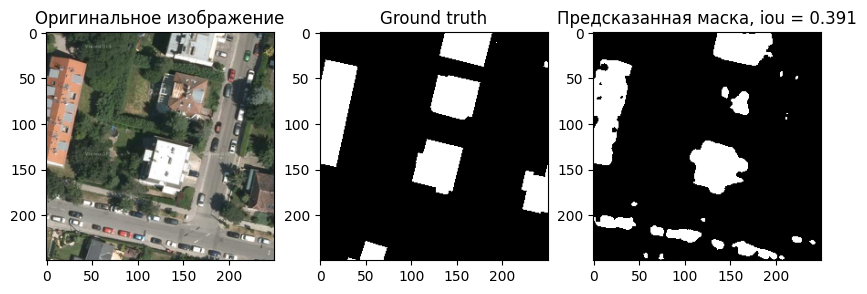


Epoch: 002 train_loss: 0.4324 eval_loss: 0.4447 eval_iou: 0.3913


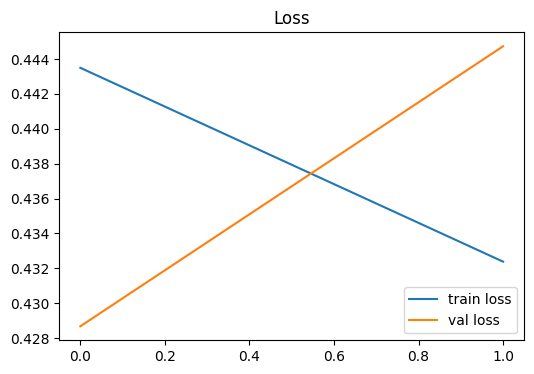


Epoch: 003 train_loss: 0.4301 eval_loss: 0.4168 eval_iou: 0.4414


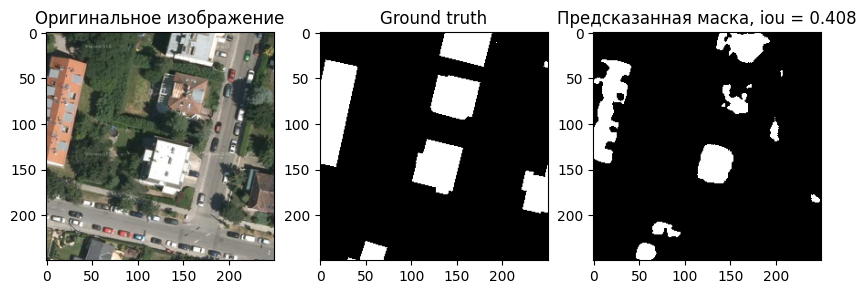


Epoch: 004 train_loss: 0.4159 eval_loss: 0.4190 eval_iou: 0.4084


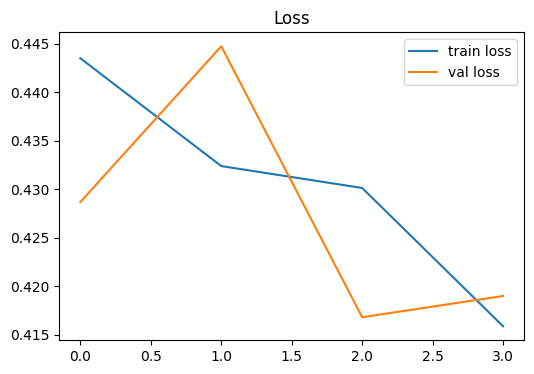


Epoch: 005 train_loss: 0.4079 eval_loss: 0.4022 eval_iou: 0.4614


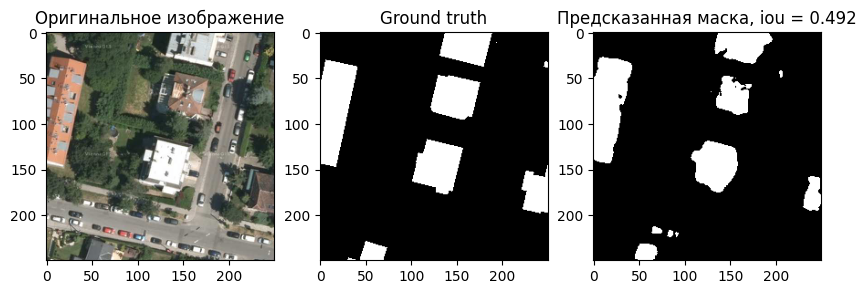


Epoch: 006 train_loss: 0.4027 eval_loss: 0.3833 eval_iou: 0.4925


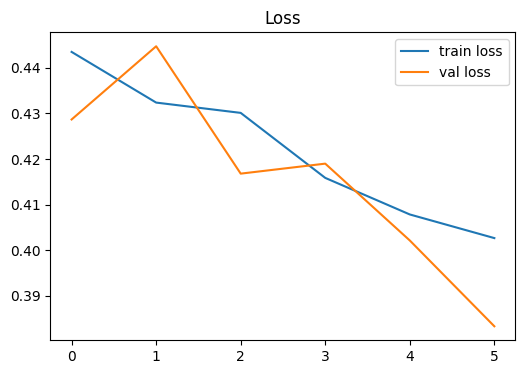


Epoch: 007 train_loss: 0.3941 eval_loss: 0.3705 eval_iou: 0.5270


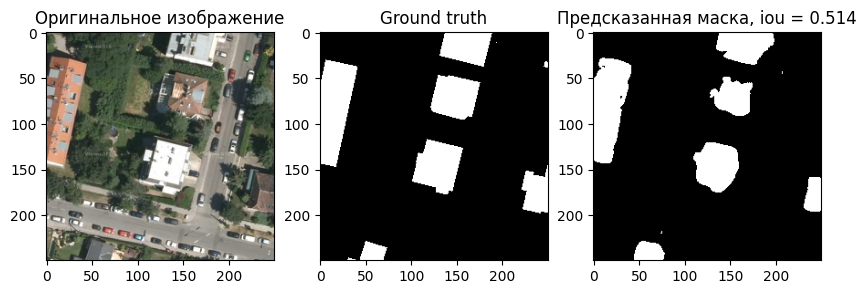


Epoch: 008 train_loss: 0.3859 eval_loss: 0.3664 eval_iou: 0.5140


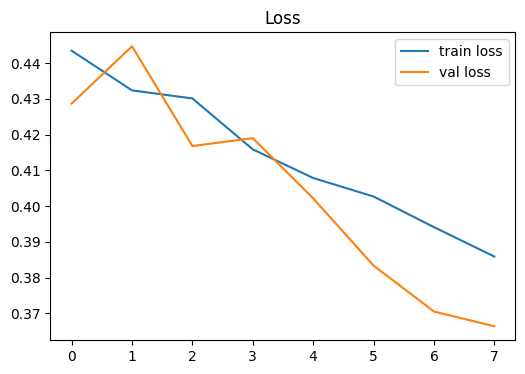


Epoch: 009 train_loss: 0.3790 eval_loss: 0.3579 eval_iou: 0.5463


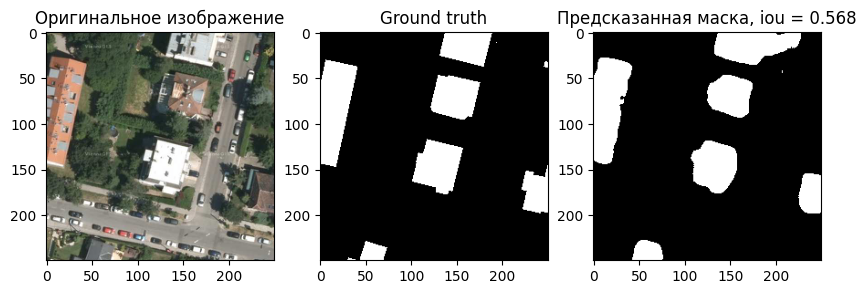


Epoch: 010 train_loss: 0.3715 eval_loss: 0.3404 eval_iou: 0.5675


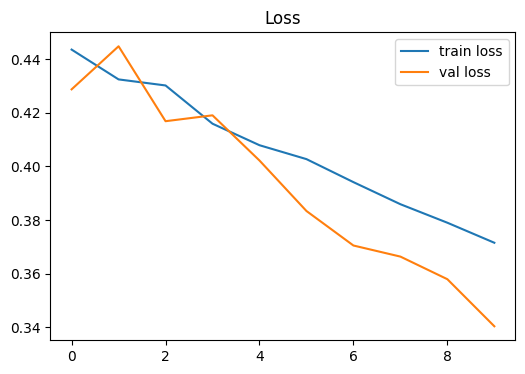


Epoch: 011 train_loss: 0.3635 eval_loss: 0.3372 eval_iou: 0.5681


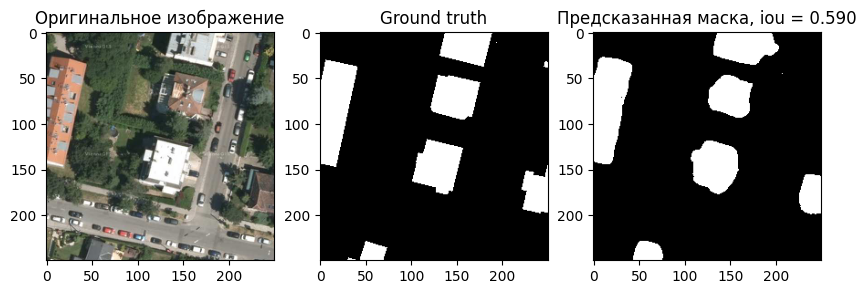


Epoch: 012 train_loss: 0.3596 eval_loss: 0.3301 eval_iou: 0.5899


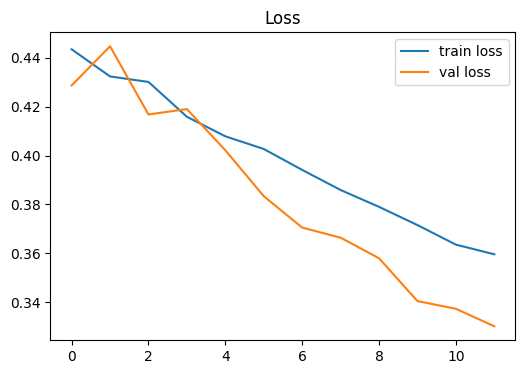


Epoch: 013 train_loss: 0.3516 eval_loss: 0.3326 eval_iou: 0.5858


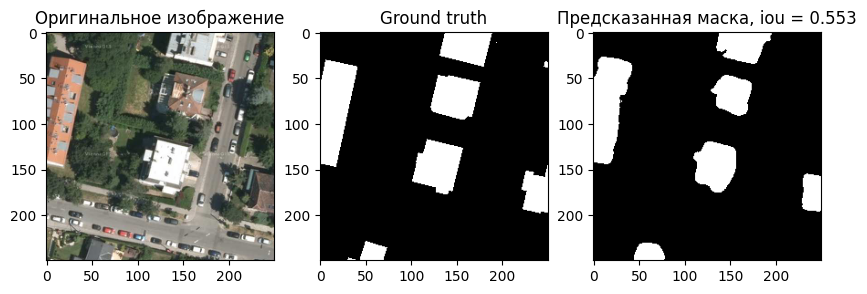


Epoch: 014 train_loss: 0.3490 eval_loss: 0.3442 eval_iou: 0.5527


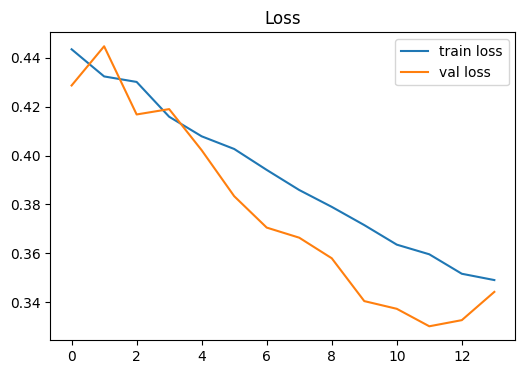


Epoch: 015 train_loss: 0.3434 eval_loss: 0.3179 eval_iou: 0.6045


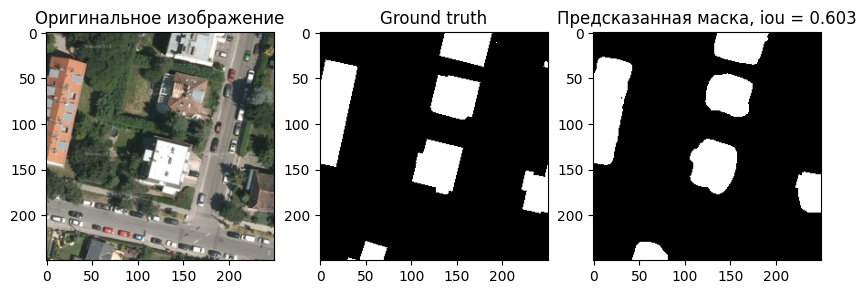


Epoch: 016 train_loss: 0.3376 eval_loss: 0.3185 eval_iou: 0.6030


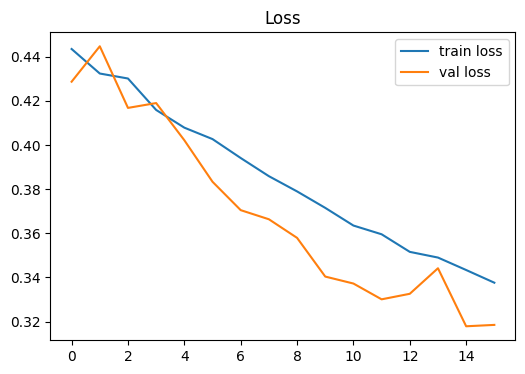


Epoch: 017 train_loss: 0.3344 eval_loss: 0.3225 eval_iou: 0.5968


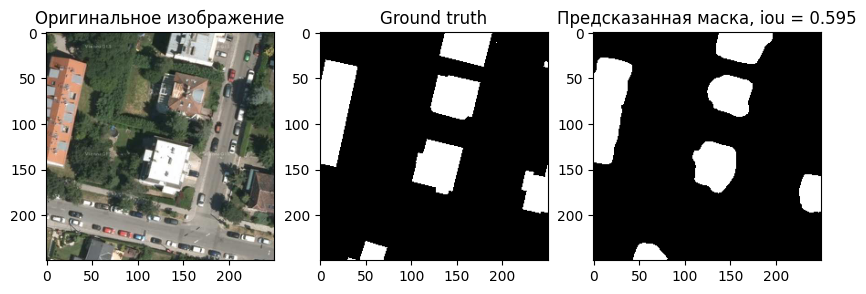


Epoch: 018 train_loss: 0.3319 eval_loss: 0.3195 eval_iou: 0.5949


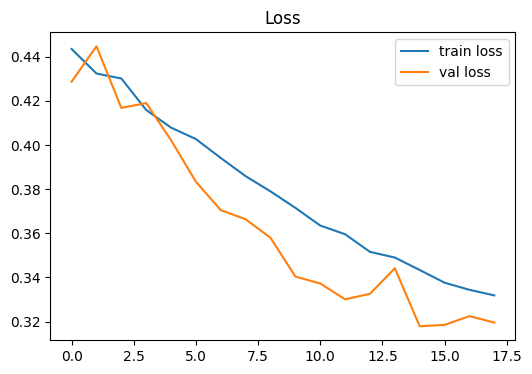


Epoch: 019 train_loss: 0.3105 eval_loss: 0.3091 eval_iou: 0.6064


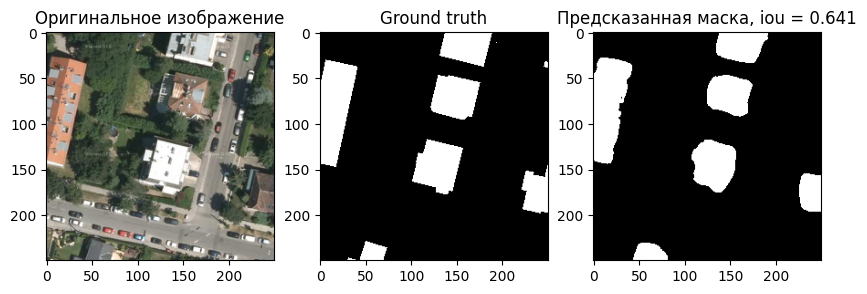


Epoch: 020 train_loss: 0.3022 eval_loss: 0.2895 eval_iou: 0.6414


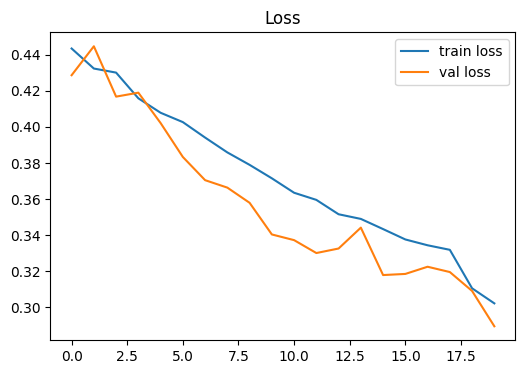

Training complete in 61m 41s


In [ ]:
unet_model_debug_v1 = UNet().to(DEVICE)
optimizer = torch.optim.Adam(unet_model_debug_v1.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=2)
criterion = unified_focal_loss
epochs = 20
unet_checkpoints_debug_v1 = BASE_DIR.joinpath('unet_checkpoints_debug_v1')
unet_checkpoints_debug_v1.mkdir(exist_ok=True)
unet_history_train_debug_v1 = train(unet_model_debug_v1, train_dataloader_debug, valid_dataloader_debug, epochs, criterion, optimizer, ckpt_path=unet_checkpoints_debug_v1, scheduler=scheduler, plot_loss = True)

Сохранение истории обучения.

In [ ]:
df1 = pd.DataFrame(unet_history_train_debug_v1)
df1.to_csv('unet_history_train_debug_v1.csv', index=False)

## Эксперимент 2. Модель с Unified Focal Loss в качестве функции потерь повышенным штрафом для FP (delta=0.6).

In [ ]:
unified_focal_loss_2 = UnifiedFocalLoss(delta=0.6)

epoch:   0%|          | 0/20 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.4511 eval_loss: 0.4422 eval_iou: 0.3527


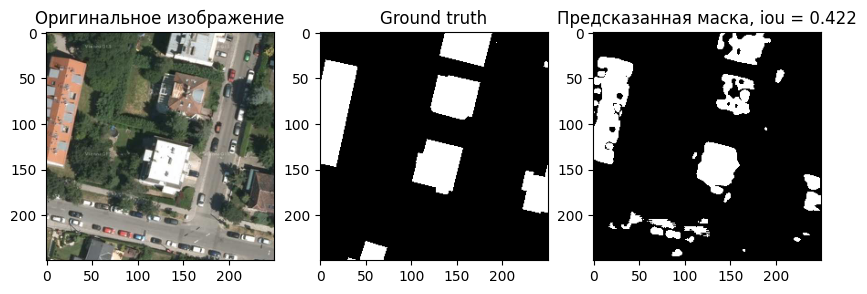


Epoch: 002 train_loss: 0.4392 eval_loss: 0.4278 eval_iou: 0.4222


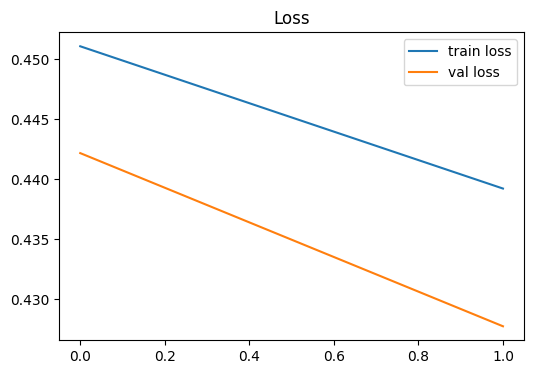


Epoch: 003 train_loss: 0.4296 eval_loss: 0.4253 eval_iou: 0.4271


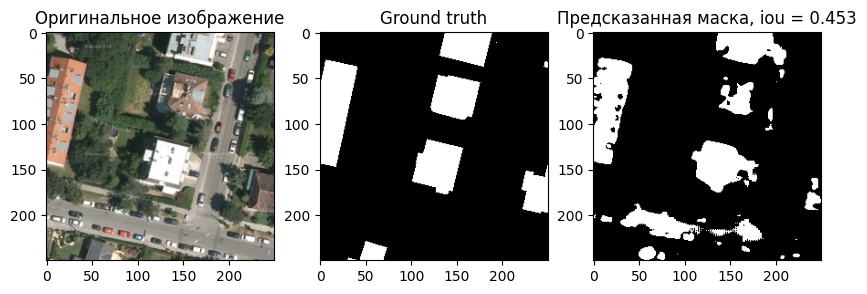


Epoch: 004 train_loss: 0.4227 eval_loss: 0.4001 eval_iou: 0.4527


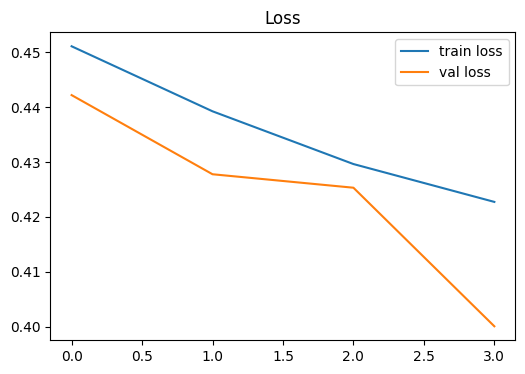


Epoch: 005 train_loss: 0.4154 eval_loss: 0.4158 eval_iou: 0.4460


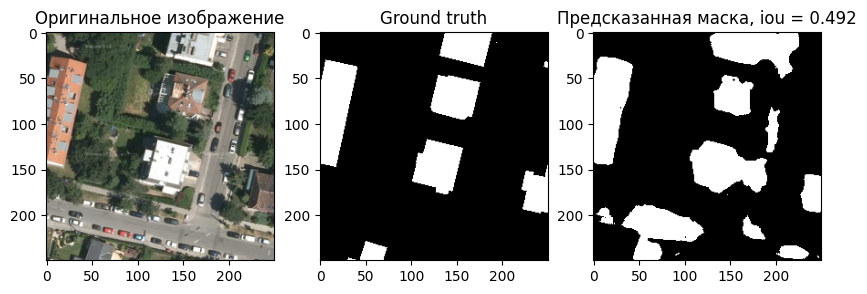


Epoch: 006 train_loss: 0.4093 eval_loss: 0.4002 eval_iou: 0.4918


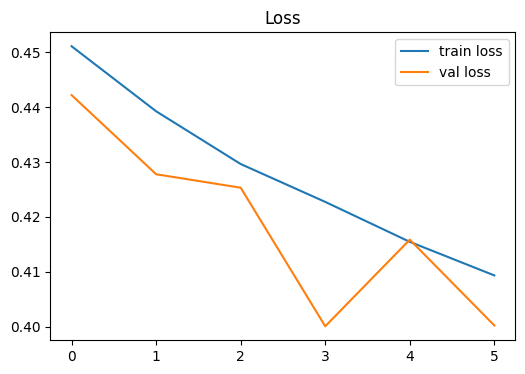


Epoch: 007 train_loss: 0.4020 eval_loss: 0.3670 eval_iou: 0.5323


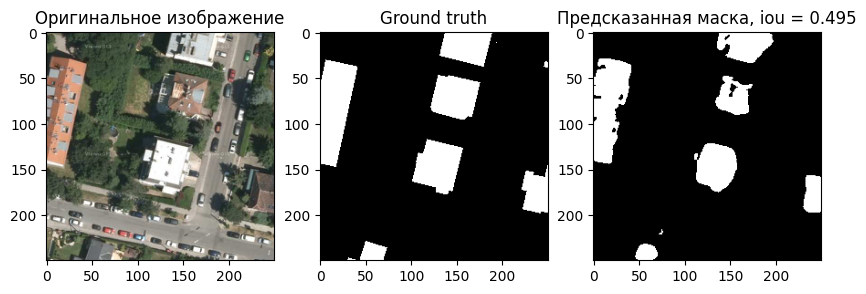


Epoch: 008 train_loss: 0.3953 eval_loss: 0.3778 eval_iou: 0.4954


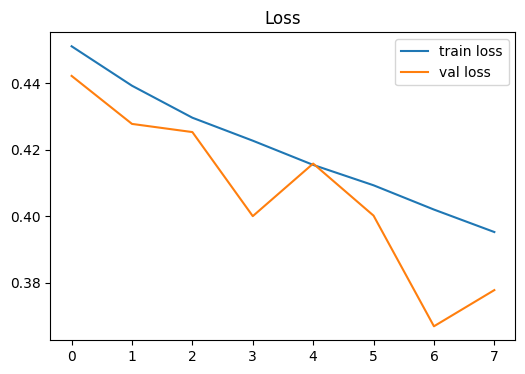


Epoch: 009 train_loss: 0.3902 eval_loss: 0.3748 eval_iou: 0.5226


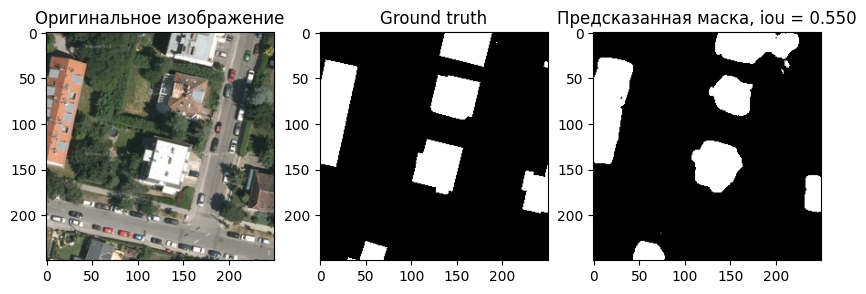


Epoch: 010 train_loss: 0.3824 eval_loss: 0.3509 eval_iou: 0.5495


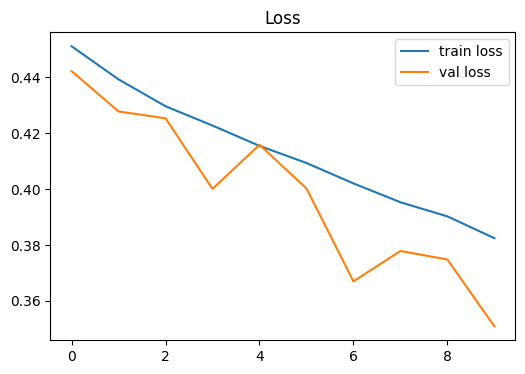


Epoch: 011 train_loss: 0.3742 eval_loss: 0.3483 eval_iou: 0.5572


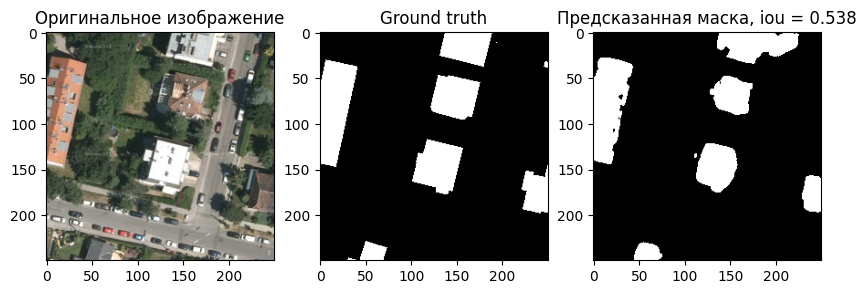


Epoch: 012 train_loss: 0.3674 eval_loss: 0.3483 eval_iou: 0.5376


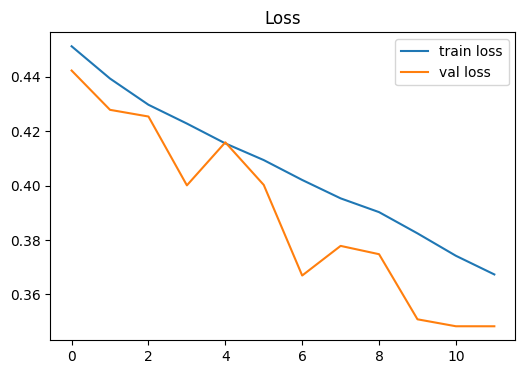


Epoch: 013 train_loss: 0.3614 eval_loss: 0.3494 eval_iou: 0.5722


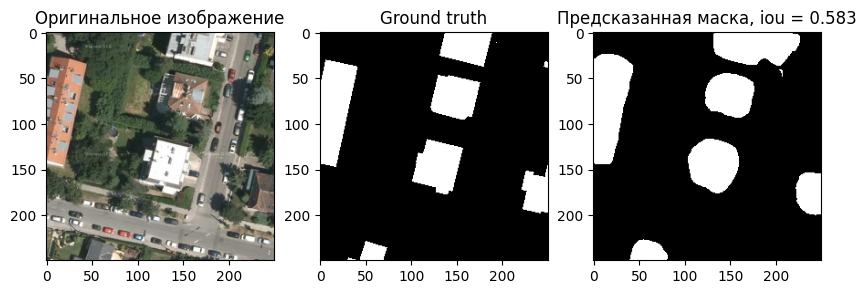


Epoch: 014 train_loss: 0.3547 eval_loss: 0.3414 eval_iou: 0.5830


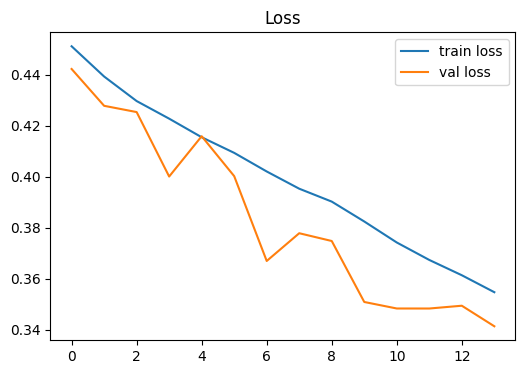


Epoch: 015 train_loss: 0.3505 eval_loss: 0.3172 eval_iou: 0.5942


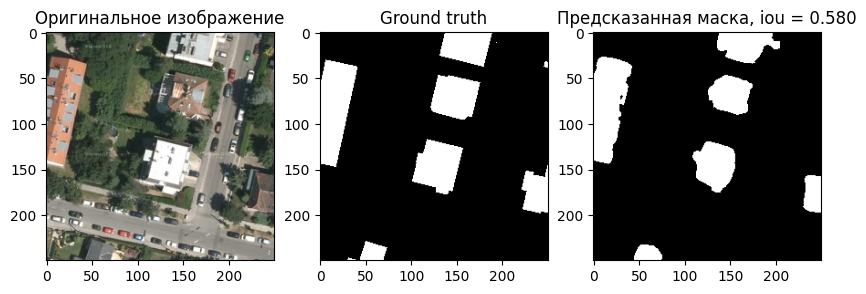


Epoch: 016 train_loss: 0.3425 eval_loss: 0.3337 eval_iou: 0.5800


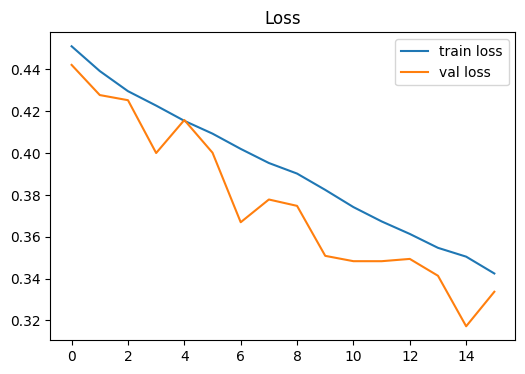


Epoch: 017 train_loss: 0.3398 eval_loss: 0.3302 eval_iou: 0.5917


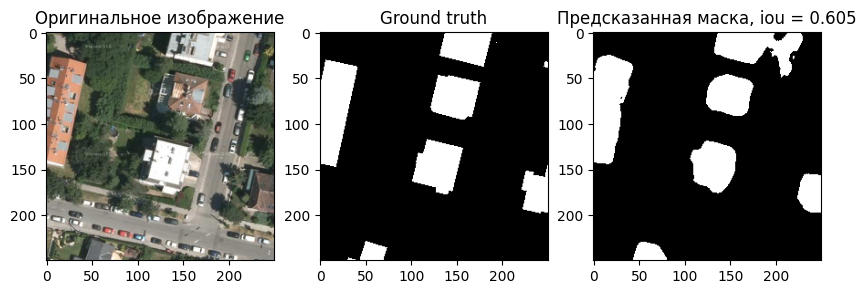


Epoch: 018 train_loss: 0.3396 eval_loss: 0.3275 eval_iou: 0.6050


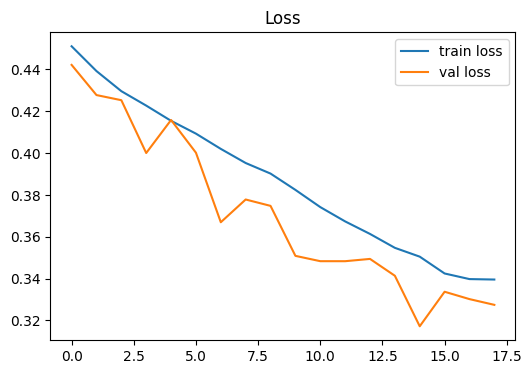


Epoch: 019 train_loss: 0.3161 eval_loss: 0.2964 eval_iou: 0.6264


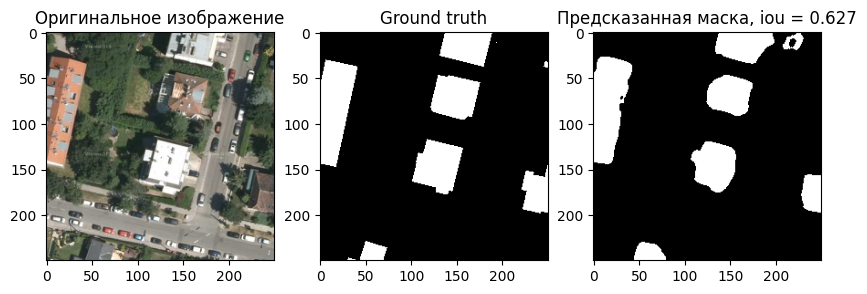


Epoch: 020 train_loss: 0.3098 eval_loss: 0.3020 eval_iou: 0.6271


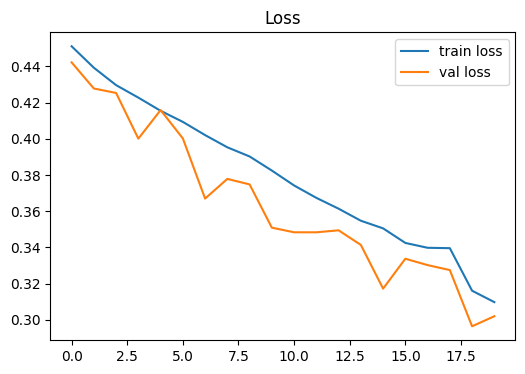

Training complete in 61m 46s


In [ ]:
unet_model_debug_v2 = UNet().to(DEVICE)
optimizer = torch.optim.Adam(unet_model_debug_v2.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=2)
criterion = unified_focal_loss_2
epochs = 20
unet_checkpoints_debug_v2 = BASE_DIR.joinpath('unet_checkpoints_debug_v2')
unet_checkpoints_debug_v2.mkdir(exist_ok=True)
unet_history_train_debug_v2 = train(unet_model_debug_v2, train_dataloader_debug, valid_dataloader_debug, epochs, criterion, optimizer, ckpt_path=unet_checkpoints_debug_v2, scheduler=scheduler, plot_loss = True)

Сохранение истории обучения.

In [ ]:
df2 = pd.DataFrame(unet_history_train_debug_v2)
df2.to_csv('unet_history_train_debug_v2.csv', index=False)

## Эксперимент 3. Модель с Unified Focal Loss в качестве функции потерь повышенным штрафом для FN (delta=0.4).

In [ ]:
unified_focal_loss_3 = UnifiedFocalLoss(delta=0.4)

epoch:   0%|          | 0/20 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.4347 eval_loss: 0.4402 eval_iou: 0.4175


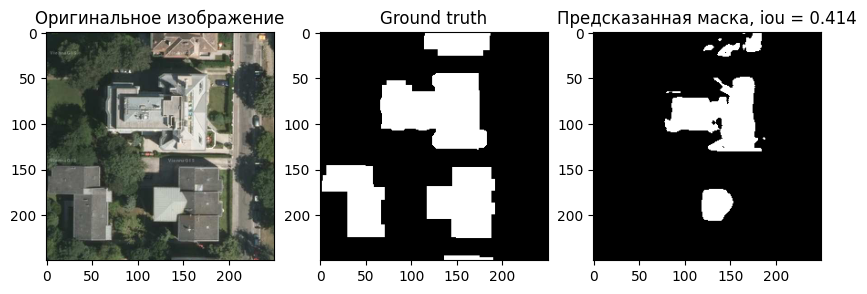


Epoch: 002 train_loss: 0.4244 eval_loss: 0.4306 eval_iou: 0.4144


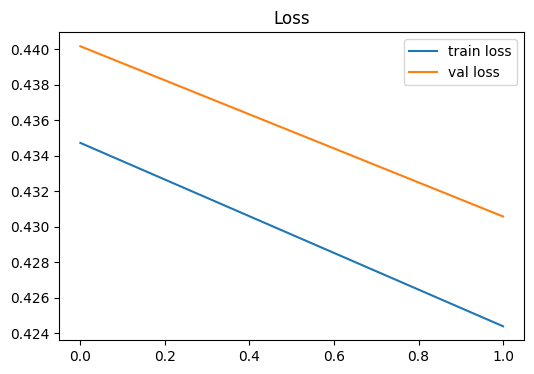


Epoch: 003 train_loss: 0.4196 eval_loss: 0.4209 eval_iou: 0.4108


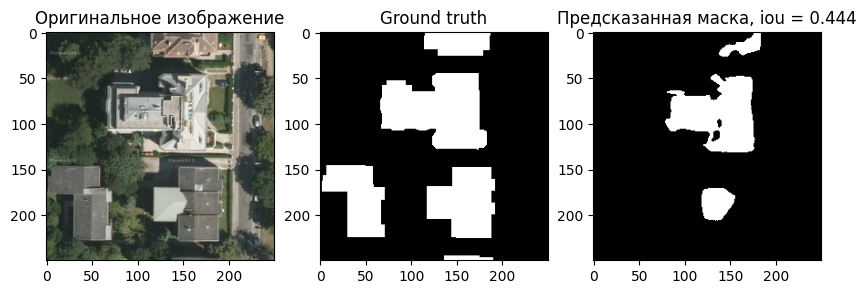


Epoch: 004 train_loss: 0.4131 eval_loss: 0.4126 eval_iou: 0.4435


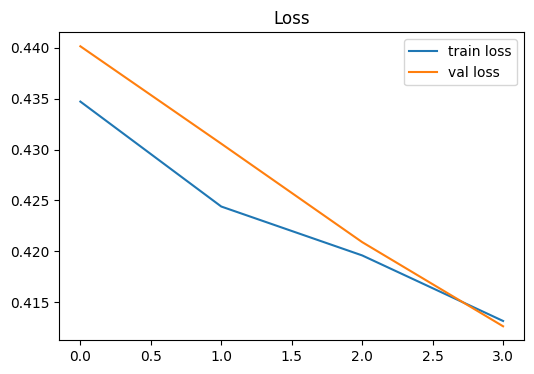


Epoch: 005 train_loss: 0.4083 eval_loss: 0.3930 eval_iou: 0.4694


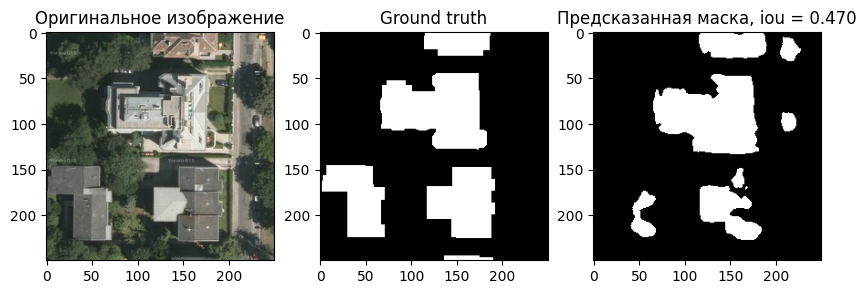


Epoch: 006 train_loss: 0.4004 eval_loss: 0.3894 eval_iou: 0.4697


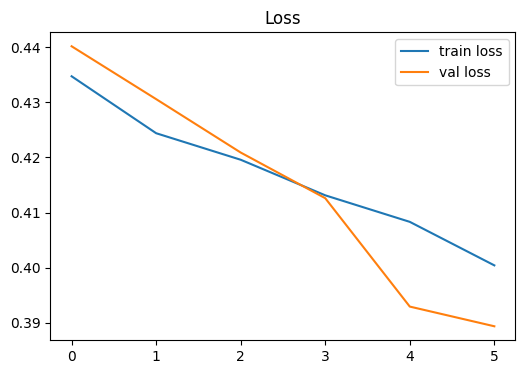


Epoch: 007 train_loss: 0.3909 eval_loss: 0.3996 eval_iou: 0.4850


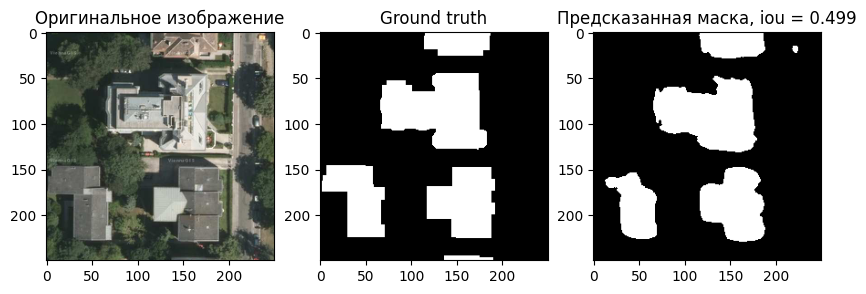


Epoch: 008 train_loss: 0.3899 eval_loss: 0.3780 eval_iou: 0.4994


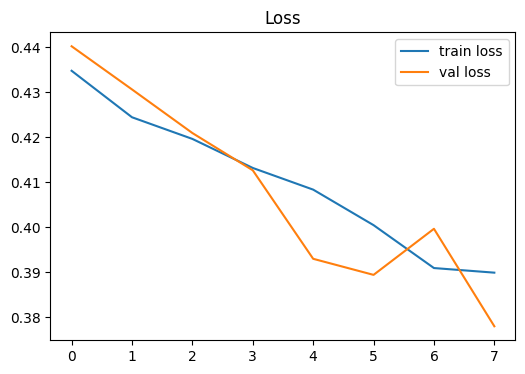


Epoch: 009 train_loss: 0.3838 eval_loss: 0.3685 eval_iou: 0.5115


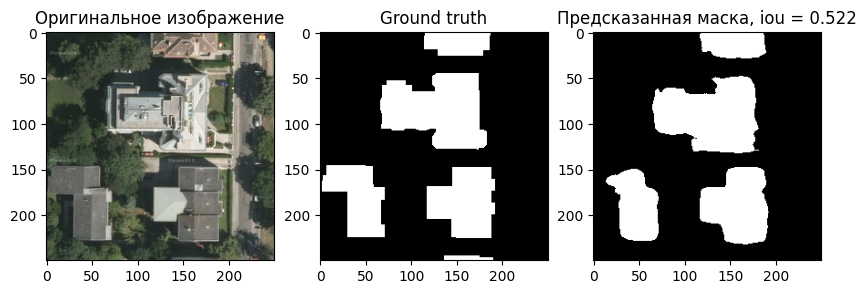


Epoch: 010 train_loss: 0.3765 eval_loss: 0.3692 eval_iou: 0.5224


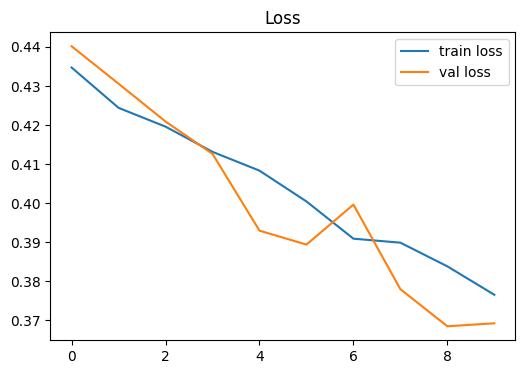


Epoch: 011 train_loss: 0.3716 eval_loss: 0.3521 eval_iou: 0.5512


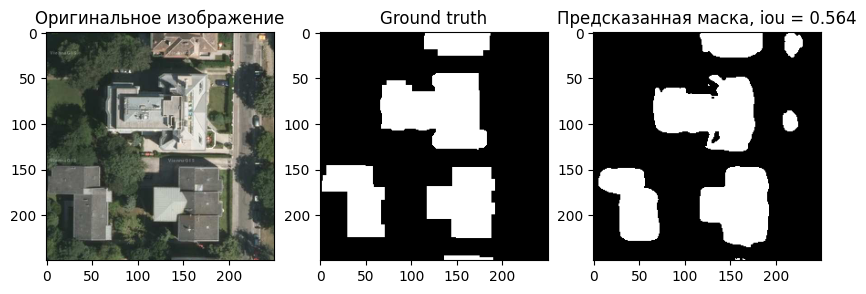


Epoch: 012 train_loss: 0.3694 eval_loss: 0.3418 eval_iou: 0.5643


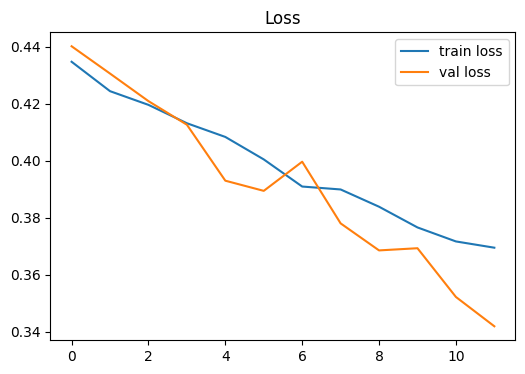


Epoch: 013 train_loss: 0.3626 eval_loss: 0.3509 eval_iou: 0.5405


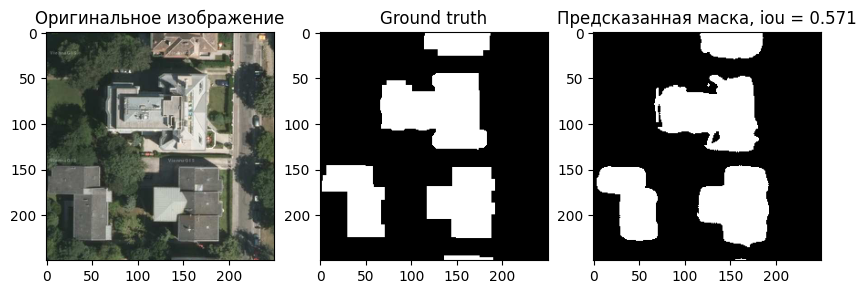


Epoch: 014 train_loss: 0.3522 eval_loss: 0.3427 eval_iou: 0.5705


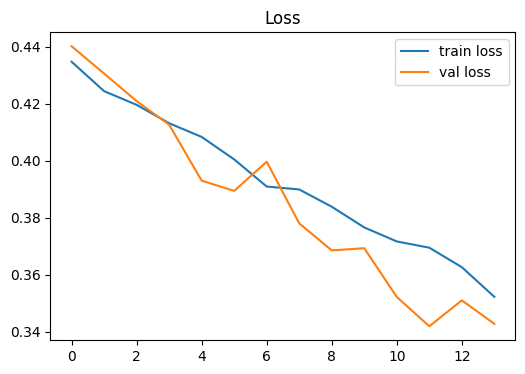


Epoch: 015 train_loss: 0.3493 eval_loss: 0.3270 eval_iou: 0.5804


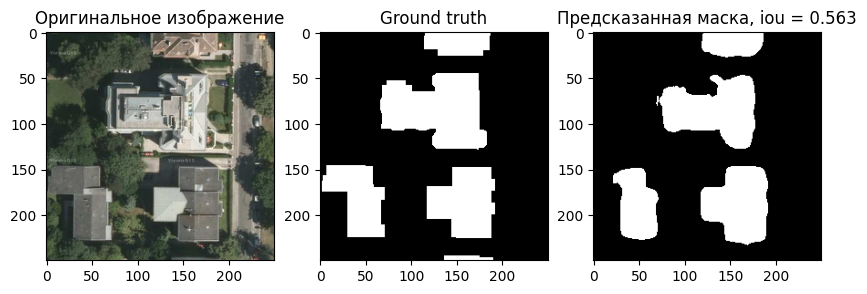


Epoch: 016 train_loss: 0.3465 eval_loss: 0.3455 eval_iou: 0.5627


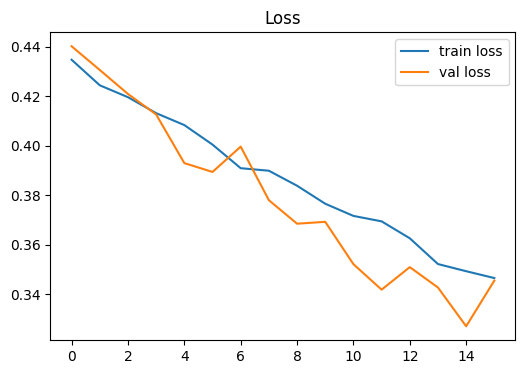


Epoch: 017 train_loss: 0.3365 eval_loss: 0.3263 eval_iou: 0.5787


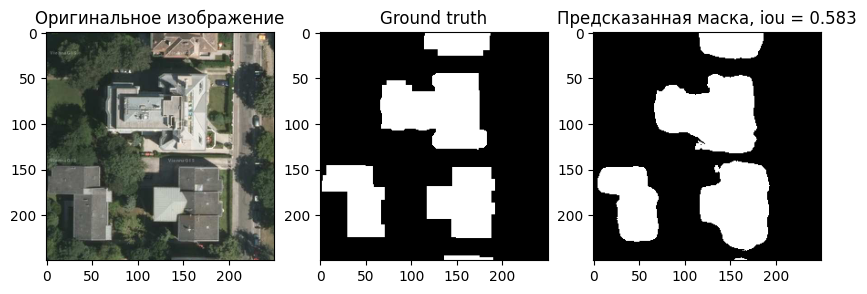


Epoch: 018 train_loss: 0.3318 eval_loss: 0.3268 eval_iou: 0.5833


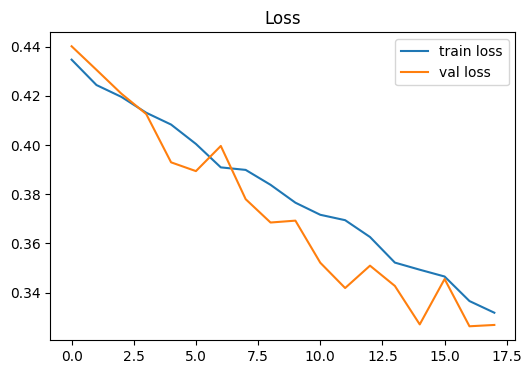


Epoch: 019 train_loss: 0.3291 eval_loss: 0.3216 eval_iou: 0.5973


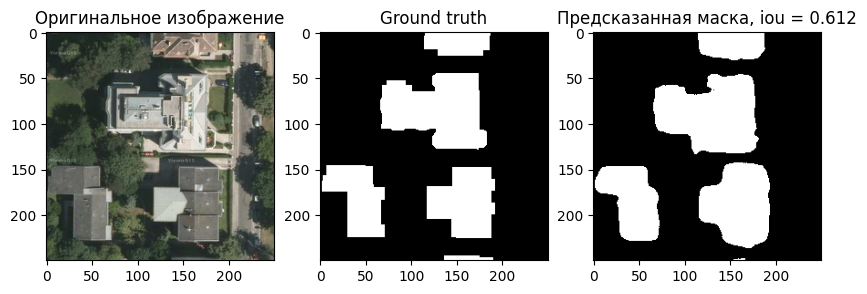


Epoch: 020 train_loss: 0.3290 eval_loss: 0.3071 eval_iou: 0.6118


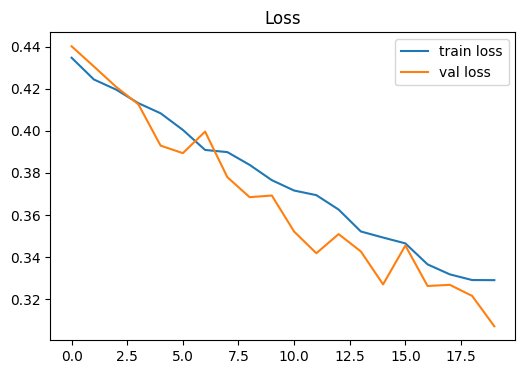

Training complete in 66m 31s


In [ ]:
unet_model_debug_v3 = UNet().to(DEVICE)
optimizer = torch.optim.Adam(unet_model_debug_v3.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=2)
criterion = unified_focal_loss_3
epochs = 20
unet_checkpoints_debug_v3 = BASE_DIR.joinpath('unet_checkpoints_debug_v3')
unet_checkpoints_debug_v3.mkdir(exist_ok=True)
unet_history_train_debug_v3 = train(unet_model_debug_v3, train_dataloader_debug, valid_dataloader_debug, epochs, criterion, optimizer, ckpt_path=unet_checkpoints_debug_v3, scheduler=scheduler, plot_loss = True)

Сохранение истории обучения.

In [ ]:
df3 = pd.DataFrame(unet_history_train_debug_v3)

df3.to_csv(BASE_DIR.joinpath('unet_history_train_debug_v3.csv'), index=False)

## Эксперимент 4. Модель с Unified Focal Loss в качестве функции потерь небольшим уклоном штрафа для FN (delta=0.45).

In [ ]:
unified_focal_loss_4 = UnifiedFocalLoss(delta=0.45)

epoch:   0%|          | 0/20 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.4366 eval_loss: 0.4393 eval_iou: 0.3363


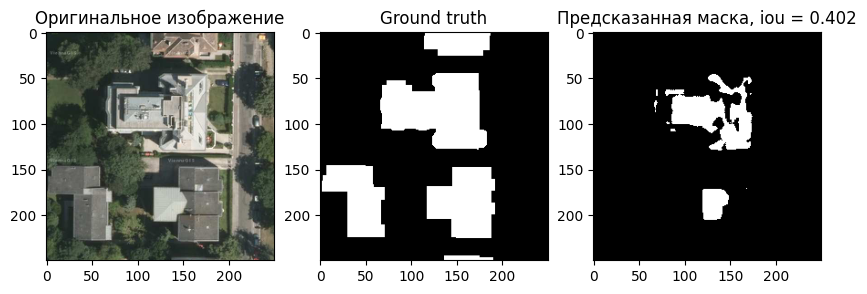


Epoch: 002 train_loss: 0.4246 eval_loss: 0.4329 eval_iou: 0.4016


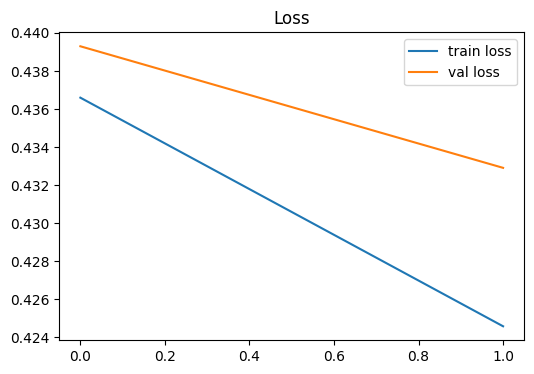


Epoch: 003 train_loss: 0.4187 eval_loss: 0.4135 eval_iou: 0.4393


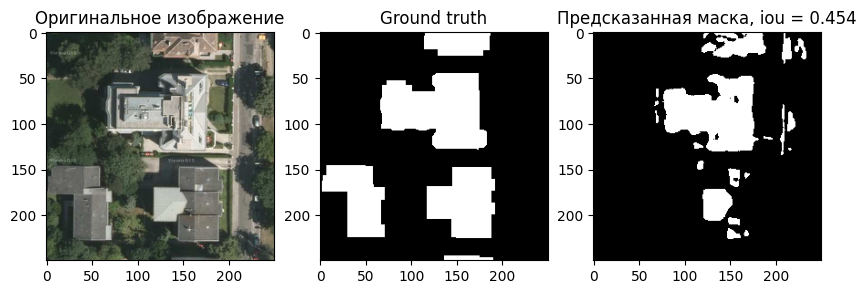


Epoch: 004 train_loss: 0.4137 eval_loss: 0.4011 eval_iou: 0.4540


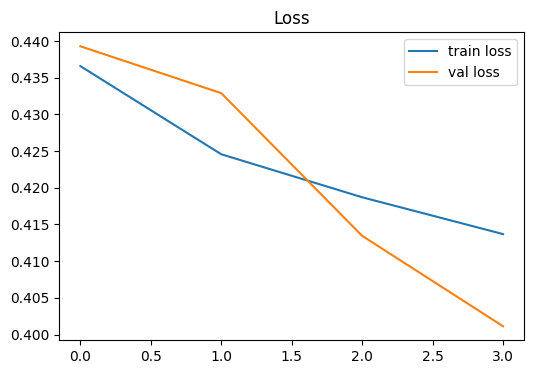


Epoch: 005 train_loss: 0.4077 eval_loss: 0.3938 eval_iou: 0.4652


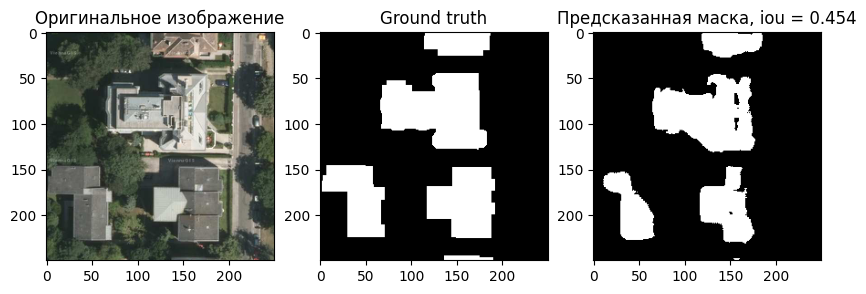


Epoch: 006 train_loss: 0.3994 eval_loss: 0.4100 eval_iou: 0.4541


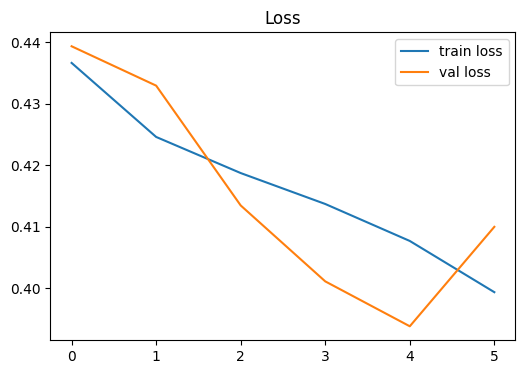


Epoch: 007 train_loss: 0.3914 eval_loss: 0.3820 eval_iou: 0.4964


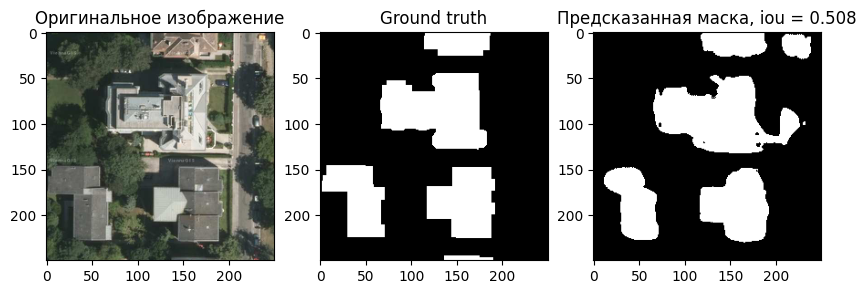


Epoch: 008 train_loss: 0.3851 eval_loss: 0.3798 eval_iou: 0.5075


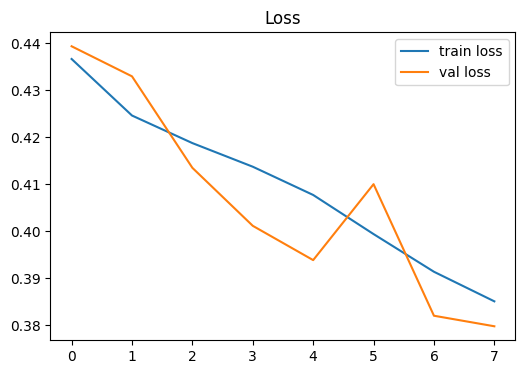


Epoch: 009 train_loss: 0.3781 eval_loss: 0.3567 eval_iou: 0.5290


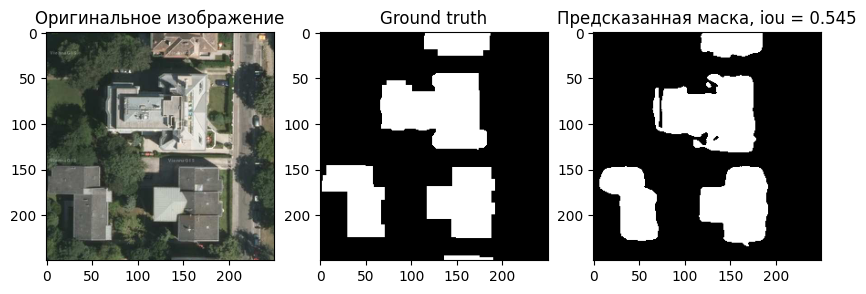


Epoch: 010 train_loss: 0.3709 eval_loss: 0.3714 eval_iou: 0.5447


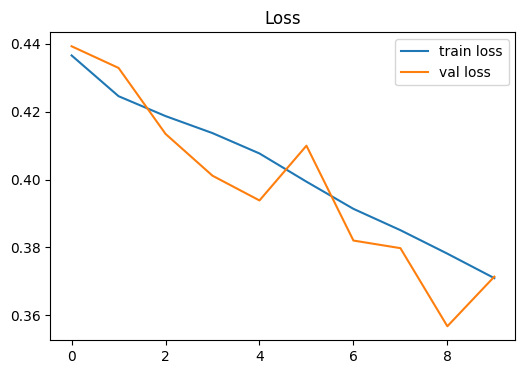


Epoch: 011 train_loss: 0.3645 eval_loss: 0.3529 eval_iou: 0.5347


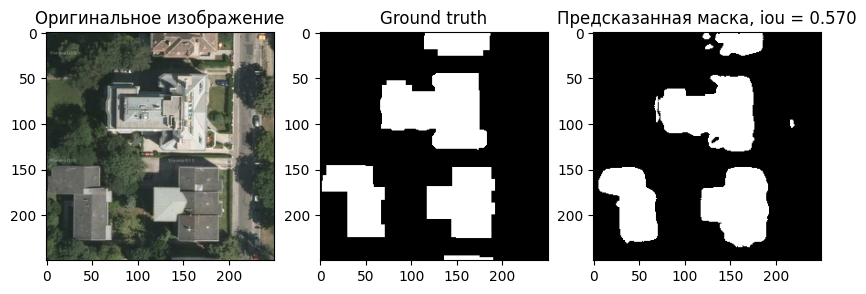


Epoch: 012 train_loss: 0.3552 eval_loss: 0.3356 eval_iou: 0.5701


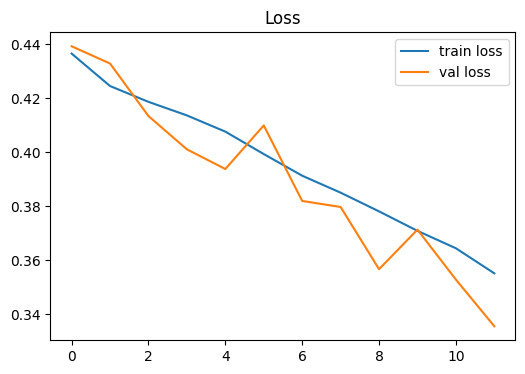


Epoch: 013 train_loss: 0.3505 eval_loss: 0.3331 eval_iou: 0.5774


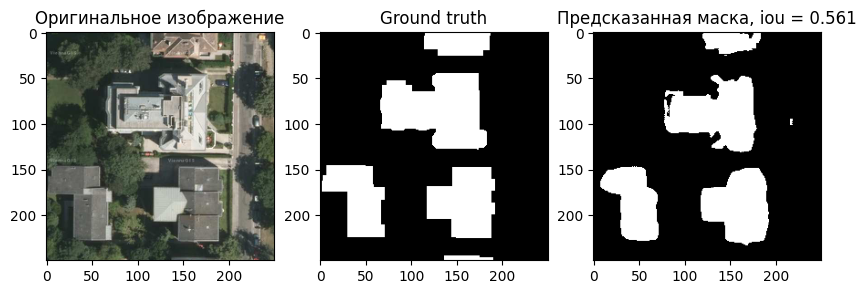


Epoch: 014 train_loss: 0.3489 eval_loss: 0.3369 eval_iou: 0.5609


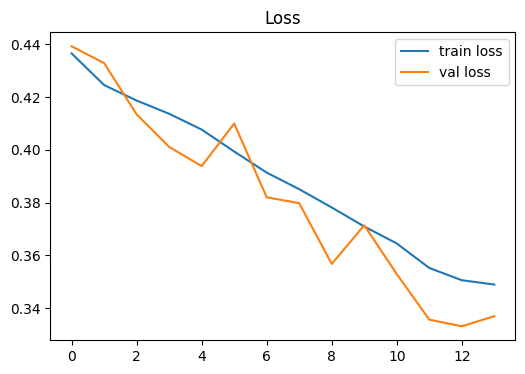


Epoch: 015 train_loss: 0.3449 eval_loss: 0.3312 eval_iou: 0.5916


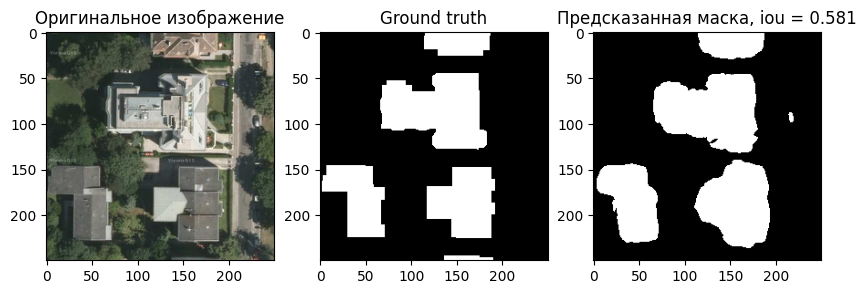


Epoch: 016 train_loss: 0.3360 eval_loss: 0.3330 eval_iou: 0.5807


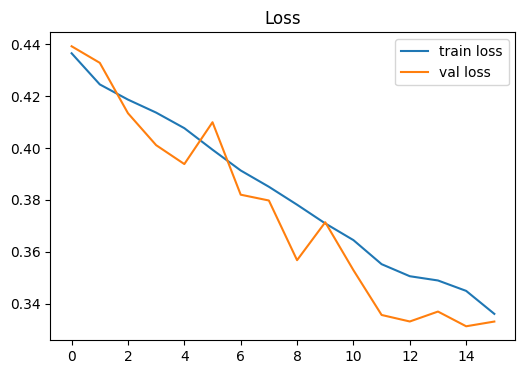


Epoch: 017 train_loss: 0.3328 eval_loss: 0.3218 eval_iou: 0.5934


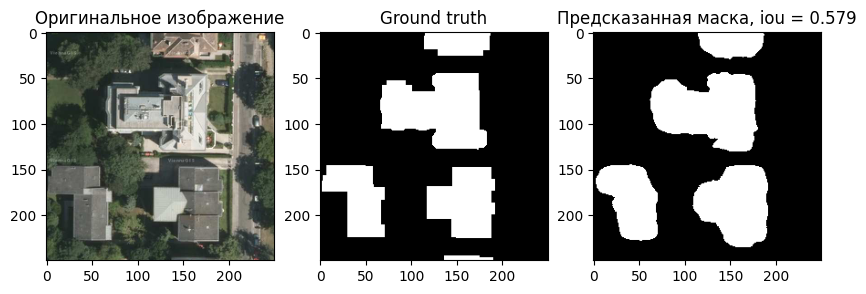


Epoch: 018 train_loss: 0.3327 eval_loss: 0.3290 eval_iou: 0.5794


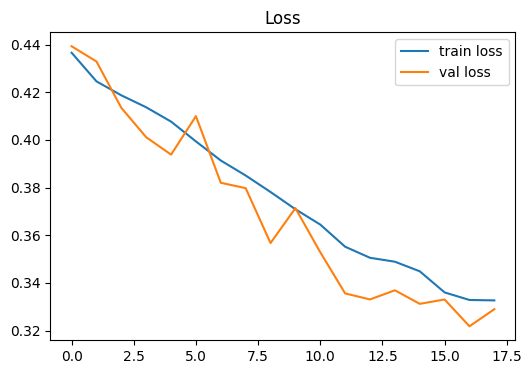


Epoch: 019 train_loss: 0.3263 eval_loss: 0.3138 eval_iou: 0.6090


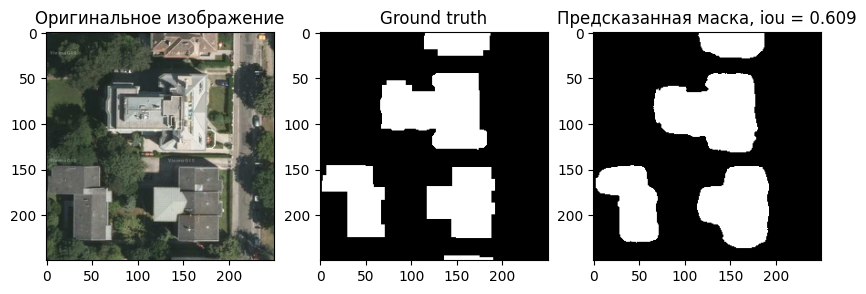


Epoch: 020 train_loss: 0.3249 eval_loss: 0.3092 eval_iou: 0.6092


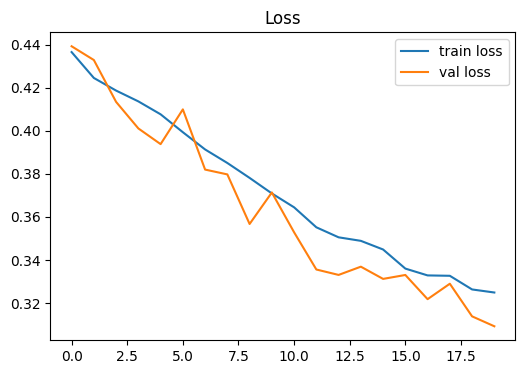

Training complete in 59m 8s


In [ ]:
unet_model_debug_v4 = UNet().to(DEVICE)
optimizer = torch.optim.Adam(unet_model_debug_v4.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=2)
criterion = unified_focal_loss_4
epochs = 20
unet_checkpoints_debug_v4 = BASE_DIR.joinpath('unet_checkpoints_debug_v4')
unet_checkpoints_debug_v4.mkdir(exist_ok=True)
unet_history_train_debug_v4 = train(unet_model_debug_v4, train_dataloader_debug, valid_dataloader_debug, epochs, criterion, optimizer, ckpt_path=unet_checkpoints_debug_v4, scheduler=scheduler, plot_loss = True)

Сохранение истории обучения.

In [ ]:
df4 = pd.DataFrame(unet_history_train_debug_v4)
df4.to_csv(BASE_DIR.joinpath('unet_checkpoints_debug_v4/unet_history_train_debug_v4.csv'), index=False)

## Эксперимент 5. Модель с Unified Focal Loss в качестве функции потерь небольшим уклоном штрафа для FP (delta=0.55).

In [ ]:
unified_focal_loss_5 = UnifiedFocalLoss(delta=0.55)

epoch:   0%|          | 0/20 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.4506 eval_loss: 0.4495 eval_iou: 0.3710


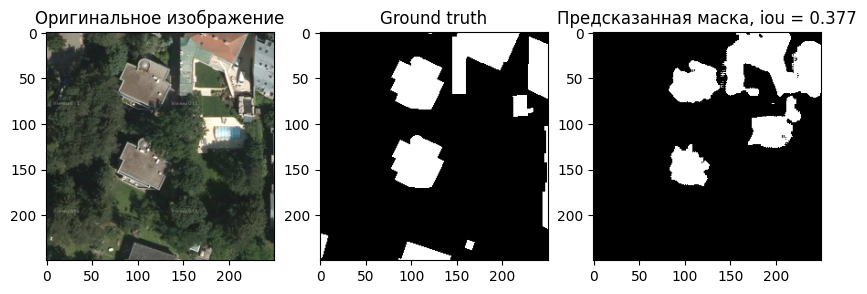


Epoch: 002 train_loss: 0.4377 eval_loss: 0.4538 eval_iou: 0.3775


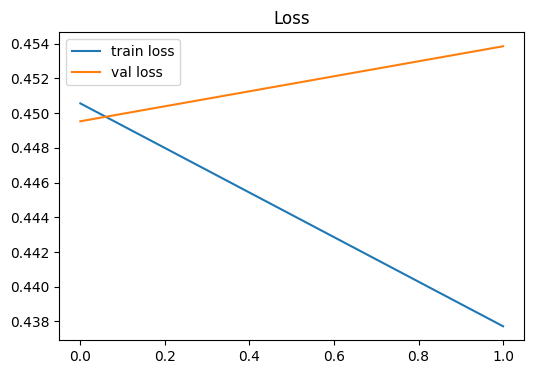


Epoch: 003 train_loss: 0.4299 eval_loss: 0.4360 eval_iou: 0.3872


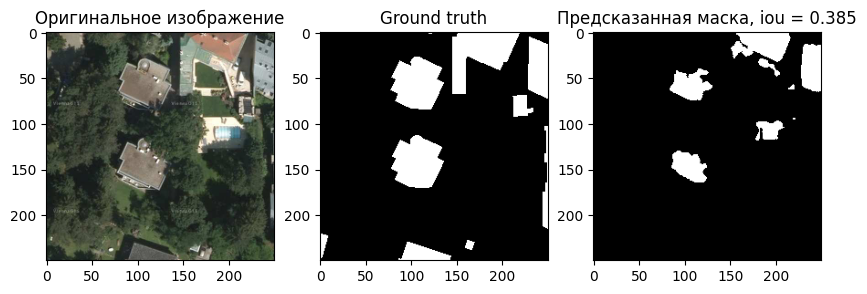


Epoch: 004 train_loss: 0.4214 eval_loss: 0.4315 eval_iou: 0.3846


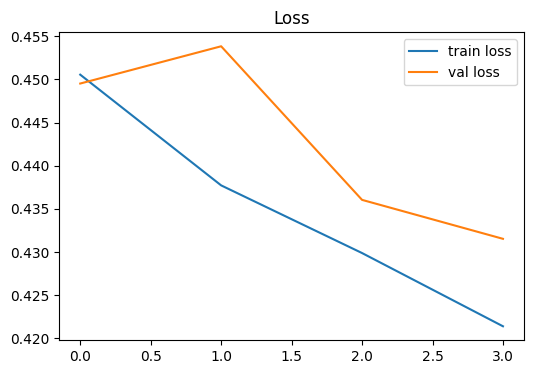


Epoch: 005 train_loss: 0.4160 eval_loss: 0.4129 eval_iou: 0.4231


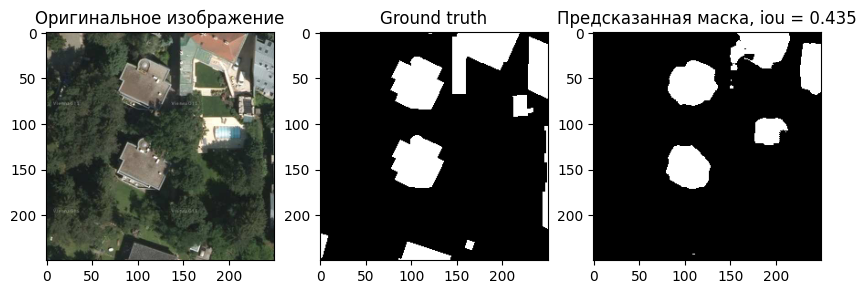


Epoch: 006 train_loss: 0.4090 eval_loss: 0.4158 eval_iou: 0.4352


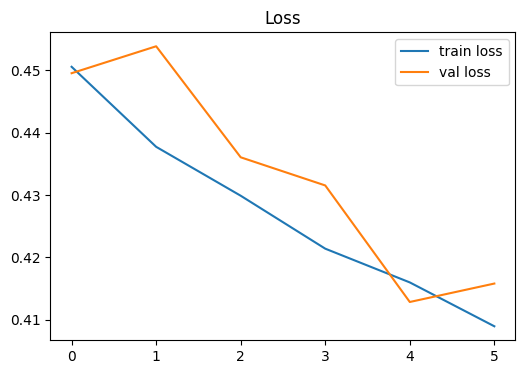


Epoch: 007 train_loss: 0.4027 eval_loss: 0.4079 eval_iou: 0.4665


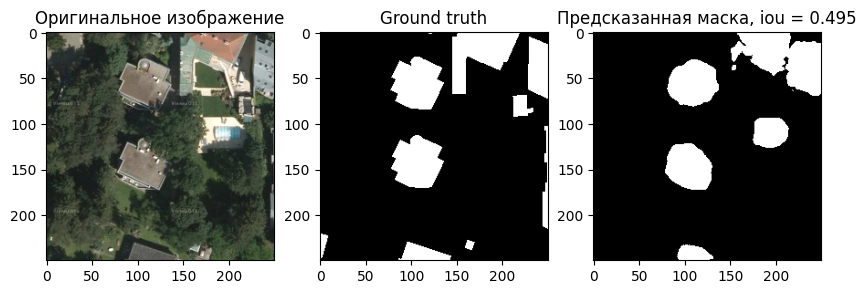


Epoch: 008 train_loss: 0.3951 eval_loss: 0.3881 eval_iou: 0.4949


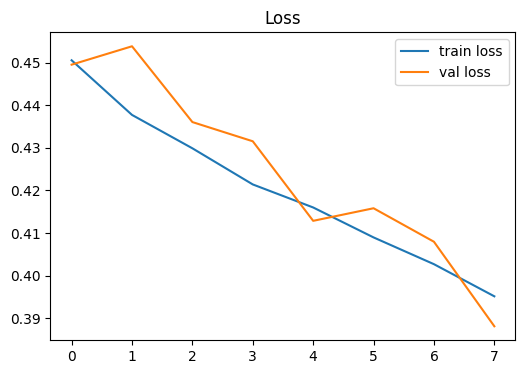


Epoch: 009 train_loss: 0.3859 eval_loss: 0.3832 eval_iou: 0.5005


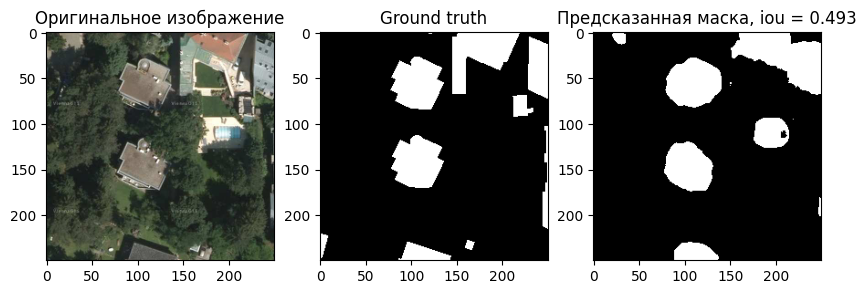


Epoch: 010 train_loss: 0.3775 eval_loss: 0.4036 eval_iou: 0.4933


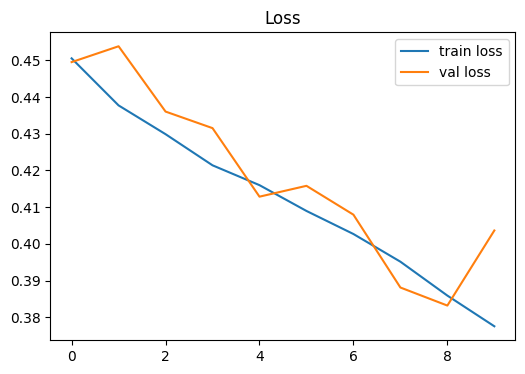


Epoch: 011 train_loss: 0.3696 eval_loss: 0.3664 eval_iou: 0.5254


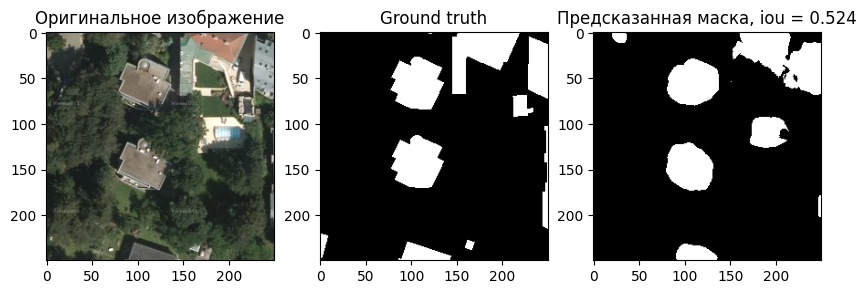


Epoch: 012 train_loss: 0.3682 eval_loss: 0.3625 eval_iou: 0.5235


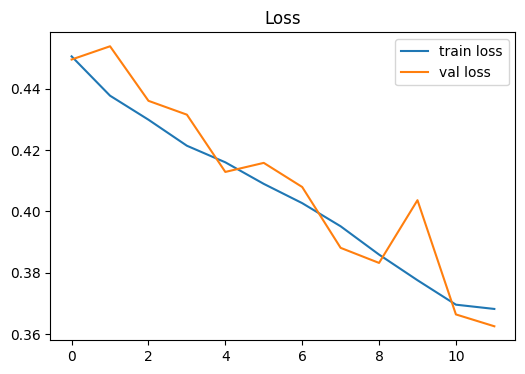


Epoch: 013 train_loss: 0.3623 eval_loss: 0.3515 eval_iou: 0.5398


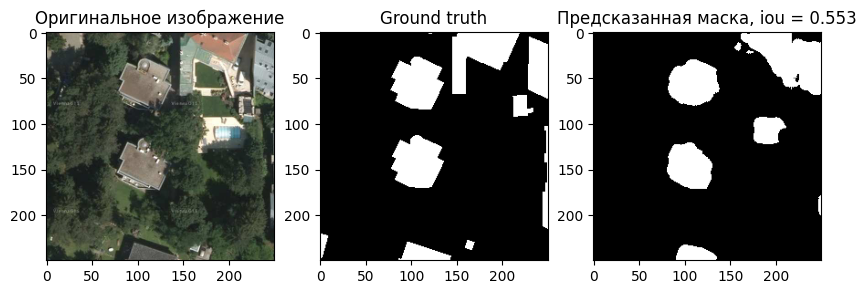


Epoch: 014 train_loss: 0.3607 eval_loss: 0.3493 eval_iou: 0.5526


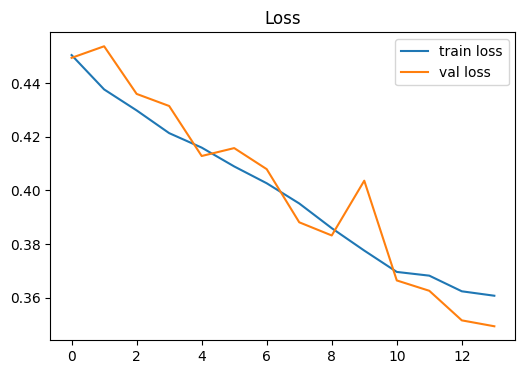


Epoch: 015 train_loss: 0.3522 eval_loss: 0.3451 eval_iou: 0.5584


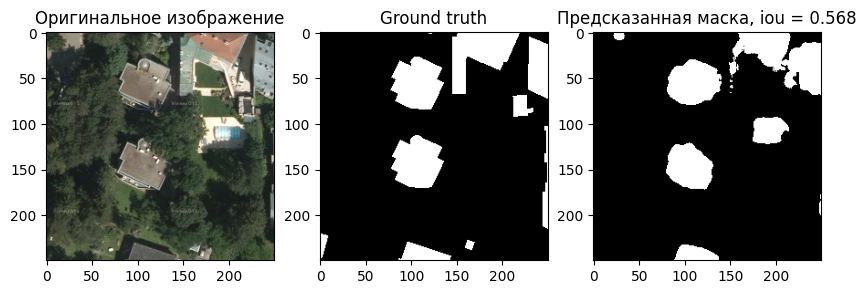


Epoch: 016 train_loss: 0.3485 eval_loss: 0.3381 eval_iou: 0.5676


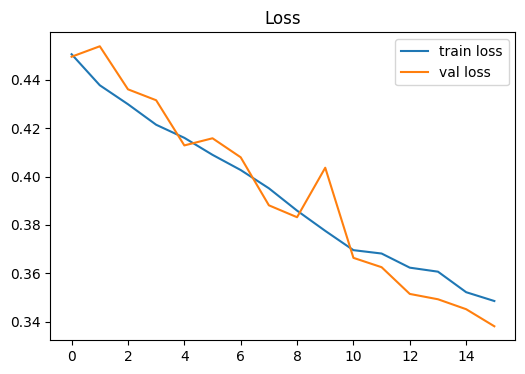


Epoch: 017 train_loss: 0.3405 eval_loss: 0.3437 eval_iou: 0.5682


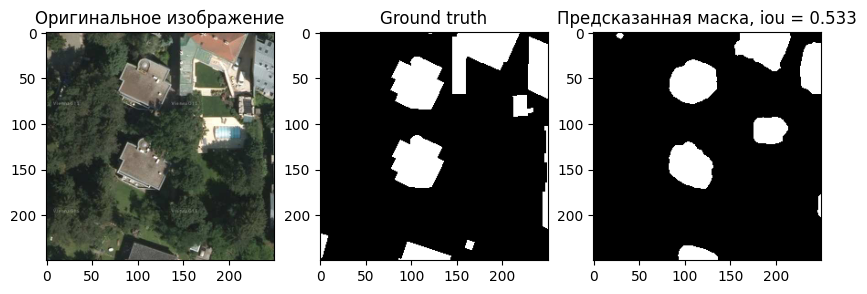


Epoch: 018 train_loss: 0.3387 eval_loss: 0.3574 eval_iou: 0.5333


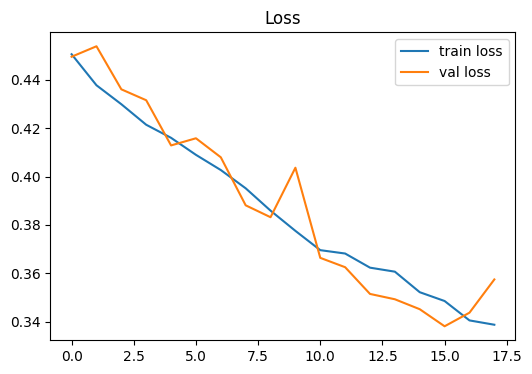


Epoch: 019 train_loss: 0.3360 eval_loss: 0.3317 eval_iou: 0.5779


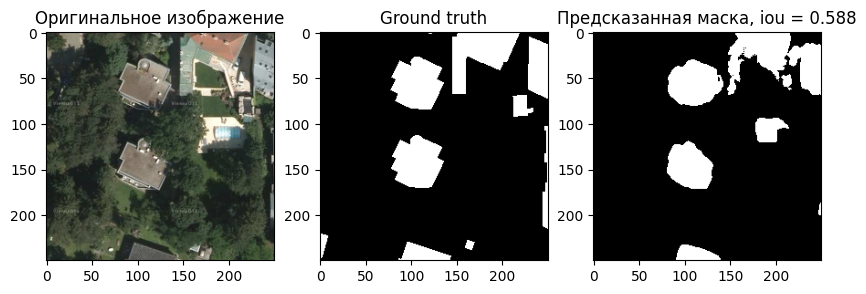


Epoch: 020 train_loss: 0.3341 eval_loss: 0.3225 eval_iou: 0.5876


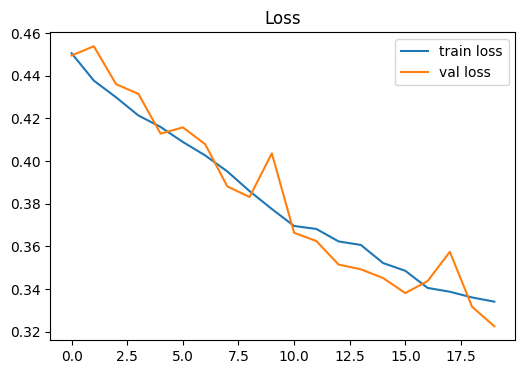

Training complete in 65m 1s


In [ ]:
unet_model_debug_v5 = UNet().to(DEVICE)
optimizer = torch.optim.Adam(unet_model_debug_v5.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=2)
criterion = unified_focal_loss_5
epochs = 20
unet_checkpoints_debug_v5 = BASE_DIR.joinpath('unet_checkpoints_debug_v5')
unet_checkpoints_debug_v5.mkdir(exist_ok=True)
unet_history_train_debug_v5 = train(unet_model_debug_v5, train_dataloader_debug, valid_dataloader_debug, epochs, criterion, optimizer, ckpt_path=unet_checkpoints_debug_v5, scheduler=scheduler, plot_loss = True)

Сохранение истории обучения.

In [ ]:
df5 = pd.DataFrame(unet_history_train_debug_v5)
df5.to_csv(BASE_DIR.joinpath('unet_checkpoints_debug_v5/unet_history_train_debug_v5.csv'), index=False)

# Сравнение моделей

## История обучения

In [ ]:
df1 = pd.read_csv(BASE_DIR.joinpath('unet_checkpoints_debug_v1/unet_history_train_debug_v1.csv'))
df2 = pd.read_csv(BASE_DIR.joinpath('unet_checkpoints_debug_v2/unet_history_train_debug_v2.csv'))
df3 = pd.read_csv(BASE_DIR.joinpath('unet_checkpoints_debug_v3/unet_history_train_debug_v3.csv'))
df4 = pd.read_csv(BASE_DIR.joinpath('unet_checkpoints_debug_v4/unet_history_train_debug_v4.csv'))
df5 = pd.read_csv(BASE_DIR.joinpath('unet_checkpoints_debug_v5/unet_history_train_debug_v5.csv'))

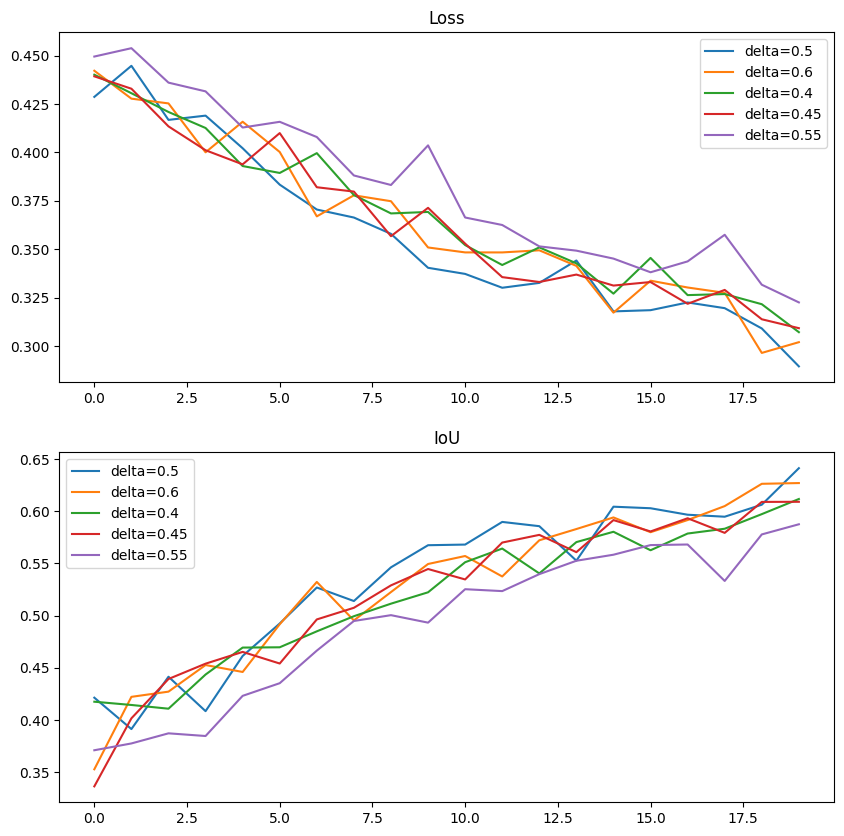

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

ax1.plot(df1['val_loss'], label = 'delta=0.5')
ax1.plot(df2['val_loss'], label = 'delta=0.6')
ax1.plot(df3['val_loss'], label = 'delta=0.4')
ax1.plot(df4['val_loss'], label = 'delta=0.45')
ax1.plot(df5['val_loss'], label = 'delta=0.55')

ax2.plot(df1['val_iou'], label='delta=0.5')
ax2.plot(df2['val_iou'], label='delta=0.6')
ax2.plot(df3['val_iou'], label='delta=0.4')
ax2.plot(df4['val_iou'], label='delta=0.45')
ax2.plot(df5['val_iou'], label='delta=0.55')

ax1.set_title("Loss")
ax2.set_title("IoU")
ax1.legend()
ax2.legend()
plt.show()

По данным графикам можно увидеть, что IoU ниже всех у варианта с delta=0.55. А выше всех у варианта с delta=0.5.

## Проверка на тестовых данных

Загрузим все сохраненные модели.

In [ ]:
unet_model_debug_v1 = UNet().to(DEVICE)
checkpoints_v1 = torch.load(BASE_DIR.joinpath('unet_checkpoints_debug_v1/best_iou.pt'), map_location=DEVICE)
unet_model_debug_v1.load_state_dict(checkpoints_v1['model_state_dict'])

unet_model_debug_v2 = UNet().to(DEVICE)
checkpoints_v2 = torch.load(BASE_DIR.joinpath('unet_checkpoints_debug_v2/best_iou.pt'), map_location=DEVICE)
unet_model_debug_v2.load_state_dict(checkpoints_v2['model_state_dict'])

unet_model_debug_v3 = UNet().to(DEVICE)
checkpoints_v3 = torch.load(BASE_DIR.joinpath('unet_checkpoints_debug_v3/best_iou.pt'), map_location=DEVICE)
unet_model_debug_v3.load_state_dict(checkpoints_v3['model_state_dict'])

unet_model_debug_v4 = UNet().to(DEVICE)
checkpoints_v4 = torch.load(BASE_DIR.joinpath('unet_checkpoints_debug_v4/best_iou.pt'), map_location=DEVICE)
unet_model_debug_v4.load_state_dict(checkpoints_v4['model_state_dict'])

unet_model_debug_v5 = UNet().to(DEVICE)
checkpoints_v5 = torch.load(BASE_DIR.joinpath('unet_checkpoints_debug_v5/best_iou.pt'), map_location=DEVICE)
unet_model_debug_v5.load_state_dict(checkpoints_v5['model_state_dict'])

<All keys matched successfully>

Загрузим тестовую выборку.

In [ ]:
TEST_GT_DIR = TEST_DIR.joinpath("gt/")
test_subimg_files = sorted(list(TEST_IMG_DIR.rglob('*.png')))
test_subimg_labels = [path.name for path in test_subimg_files]

In [ ]:
#тестовый датасет загрузим в режими 'val', т.к. нужны маски для проверки качества моделей
test_dataset_debug = GeodataDataset(test_subimg_labels, img_path=TEST_IMG_DIR, mode='val', transforms=test_transform, gt_path=TEST_GT_DIR)
batch_size = 1
test_dataloader_debug = DataLoader(test_dataset_debug, batch_size=batch_size, shuffle=False, num_workers=2,  pin_memory=True)

Found 58 images for val part


In [ ]:
data = {
  "IoU": [0, 0, 0, 0, 0],
  "Dice": [0, 0, 0, 0, 0],
  "Precision": [0, 0, 0, 0, 0],
  "Recall": [0, 0, 0, 0, 0]
}

In [ ]:
data["IoU"][0], data["Dice"][0], data["Precision"][0], data["Recall"][0] = test(unet_model_debug_v1, test_dataloader_debug)
data["IoU"][1], data["Dice"][1], data["Precision"][1], data["Recall"][1] = test(unet_model_debug_v2, test_dataloader_debug)
data["IoU"][2], data["Dice"][2], data["Precision"][2], data["Recall"][2] = test(unet_model_debug_v3, test_dataloader_debug)
data["IoU"][3], data["Dice"][3], data["Precision"][3], data["Recall"][3] = test(unet_model_debug_v4, test_dataloader_debug)
data["IoU"][4], data["Dice"][4], data["Precision"][4], data["Recall"][4] = test(unet_model_debug_v5, test_dataloader_debug)

In [ ]:
df_metrics = pd.DataFrame(data, index=['delta=0.5','delta=0.6','delta=0.4','delta=0.45','delta=0.55'])
df_metrics

,IoU,Dice,Precision,Recall
delta=0.5,0.513309,0.662488,0.556801,0.886764
delta=0.6,0.566301,0.705399,0.605930,0.915772
delta=0.4,0.583071,0.720080,0.655197,0.855047
delta=0.45,0.602102,0.733263,0.633430,0.933206
delta=0.55,0.492099,0.647271,0.549684,0.850986


In [ ]:
img, gt = next(iter(test_dataset_debug))
mask1 = predict_one(unet_model_debug_v1, img.unsqueeze(0))
mask2 = predict_one(unet_model_debug_v2, img.unsqueeze(0))
mask3 = predict_one(unet_model_debug_v3, img.unsqueeze(0))
mask4 = predict_one(unet_model_debug_v4, img.unsqueeze(0))
mask5 = predict_one(unet_model_debug_v5, img.unsqueeze(0))

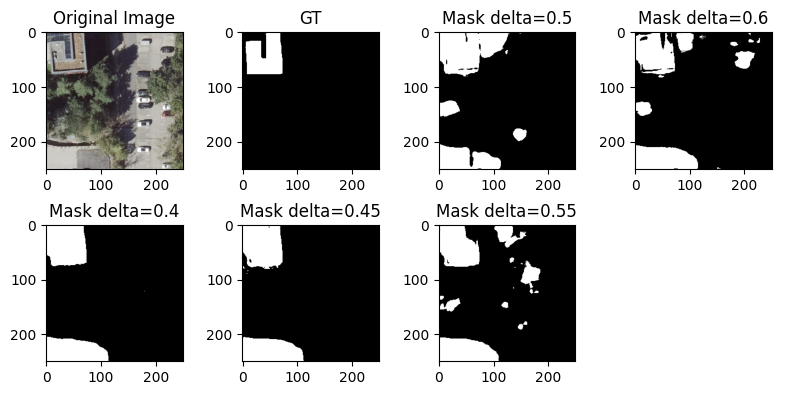

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(8, 4))

orig_img = CenterCrop(size=[250, 250])(img)
orig_img = orig_img.cpu().detach().numpy().transpose((1, 2, 0))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
orig_img = std * orig_img + mean
orig_img = np.clip(orig_img, 0, 1)
mask_gt = gt.cpu().detach().numpy().squeeze()
mask_gt = mask_gt > 0.5

axes[0,0].imshow(orig_img);
axes[0,0].set_title("Original Image")


axes[0,1].imshow(mask_gt, cmap='gray')
axes[0,1].set_title("GT")

axes[0,2].imshow(mask1, cmap='gray')
axes[0,2].set_title("Mask delta=0.5")

axes[0,3].imshow(mask2, cmap='gray')
axes[0,3].set_title("Mask delta=0.6")

axes[1,0].imshow(mask3, cmap='gray')
axes[1,0].set_title("Mask delta=0.4")

axes[1,1].imshow(mask4, cmap='gray')
axes[1,1].set_title("Mask delta=0.45")

axes[1,2].imshow(mask5, cmap='gray')
axes[1,2].set_title("Mask delta=0.55")

axes[1,3].axis('off')

plt.tight_layout()

plt.show()

По трем метрикам (IoU, Dice, Recall) выигрывает вариант с delta=0.45, причем по метрике Precision он на втором месте. Визуально этот вариант таже лучше, чем остальные.

Рассмотрим также метрики, прежде чем выбрать значение delta.


*   *IoU* - показывает насколько предсказанная маска совпадает с реальной.

*   *Dice* - похожа на Iou, но менее строгая. Обе метрики чувствительны к пересечениям, но нам это не страшно, т.к. фундамент один. Нам важна площадь застройки, а не количество зданий, хоть они друг над другом. Оптимальны для задач с одним классом, как у нас. Важны для общей оценки.

*   *Precision* - доля правильно предсказанных из всех предсказанных как положительный класс. Помогает узнать, насколько точна модель, когда она говорит, что объект имеет класс Positive.

*   *Recall* - доля правильно предсказанных положительных классов из всех реально положительных. Измеряет способность модели обнаруживать объекты, относящиеся к классу Positive.

Нам важно почситать площадь застройки, т.е. важно обнаружить все здания как можно точнее, поэтому обратим внимания больше на метрику Recall.


Таким образом, выберем delta=0.45, которая штрафует FN чуть больше, чем FP. Конечно, выборка не вся, но можно cделать предположения для отправной точки, т.к. проводить эксперименты на всей выборке очень ресурсозатратно.
